In [100]:
import helper_functions
import pandas as pd
import numpy as np
from sklearn import preprocessing
import dynamo as dyn
from shapely.geometry import MultiPoint
from shapely.geometry import Point
from shapely.geometry import Polygon
from scipy.interpolate import interp1d
from matplotlib.patches import Patch
from scipy.stats.mstats import winsorize
from scipy.interpolate import make_smoothing_spline

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

/tmp/ipykernel_54730/3777615979.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [3]:
%run '../dynamo_helper_functions.ipynb'

/tmp/ipykernel_54730/3777615979.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


['/net/capricorn/home/xing/soh29/.conda/envs/dynamo_06_2024/lib/python3.8/site-packages/dynamo']


package,umap-learn,trimap,tqdm,statsmodels,setuptools,seaborn,scipy,scikit-learn,python-igraph,pynndescent,pre-commit,pandas,numpy,numdifftools,numba,networkx,matplotlib,loompy,hdbscan,dynamo-release,cvxopt,colorcet
version,0.5.6,1.1.4,4.66.4,0.14.1,70.1.0,0.13.2,1.10.1,1.3.2,0.11.5,0.5.8,3.5.0,1.2.0,1.23.0,0.9.41,0.51.2,3.1,3.7.5,3.0.7,0.8.37,1.0.0,1.3.2,3.1.0


In [4]:
doses = [0,12,25,50,100,200,400,800]
phases = ['G1.S', 'S', 'G2', 'G2.M', 'M.G1']
colors = {'G1.S':'firebrick', 'S':'orange', 'G2':'yellowgreen', 'G2.M':'teal', 'M.G1':'royalblue'}
colors3 = {'G1.S':'#b22222', 'S':'#ffd700', 'G2':'#9acd32', 'G2.M':'#008080', 'M.G1':'#4b0082'}
data_path = '../../../data/'
save_path = 'generated-data/cell-cycle-data/'
plot_path = 'plots/reaction_coordinate/'
fig3_path = '../../../../../MCF_10A_scRNAseq/Figures/Figure 3/Figure images/'

In [64]:
same_ref_with_density = reload_data2("../generated_data/With_density/Same_Ref_With_Density_vf_", '../../generated_data/With_density/uns_dict_')

In [67]:
same_ref_without_density = reload_data2("../generated_data/Without_density/Same_Ref_Without_Density_vf_", '../../generated_data/Without_density/uns_dict_')

In [5]:
dose0 = pd.read_csv("/net/capricorn/home/xing/soh29/Research/MCF10A/notebooks/generated_data/revelio_DC/DC_dose_0.csv", index_col=0)
#dose12 = pd.read_csv("/net/capricorn/home/xing/soh29/Research/MCF10A/notebooks/generated_data/revelio_DC/DC_dose_12.csv", index_col=0)

In [7]:
#dose0 = dose0.drop(["RC nneighbor","RC region"], axis=1)

# Functions

In [111]:
# Plots lineplot along the cell cycle coordinate for a specific gene
def getGeneExp2(adata, gene, save=False, lam=None):
    if gene in adata.var.index:
        if adata.var.loc[gene]['nCells'] > 50:
            plt.figure(figsize=(4.5,3.5), dpi=100)
            temp_exp = adata[:,gene].X.toarray()
            temp_df = pd.DataFrame(temp_exp, columns=[gene])
            temp_df['RC'] = adata.obsm['X_RC'][:,0]
            temp_df = temp_df.sort_values(['RC'])
            temp_df = temp_df[temp_df[gene]!=0]
            temp_means = []
            groups = np.unique(temp_df['RC'])
            for group in groups:
                temp_means.append(np.mean(temp_df[temp_df['RC'] == group])[0])
            spl = make_smoothing_spline(groups, temp_means, lam=lam)
            plt.scatter(adata.obsm['X_RC'][:,0], temp_exp, c=adata.obs['CC'].map(colors3), cmap='Reds', s=10)
            plt.plot(temp_df['RC'], spl(temp_df['RC']), linestyle='dashed', color='black')
            plt.title(gene)
            plt.xticks([])
            plt.tight_layout()
            if save == True:
                plt.savefig("../plots/new_CCC/untreated/cc_emt_rep/lineplot/lineplot_"+gene+".png", dpi=300)
            plt.show()
        else:
            print(gene + " skipped! Only " + str(adata.var['nCells'][0]) + " cells :(")

# Obtain initial reaction coordinates

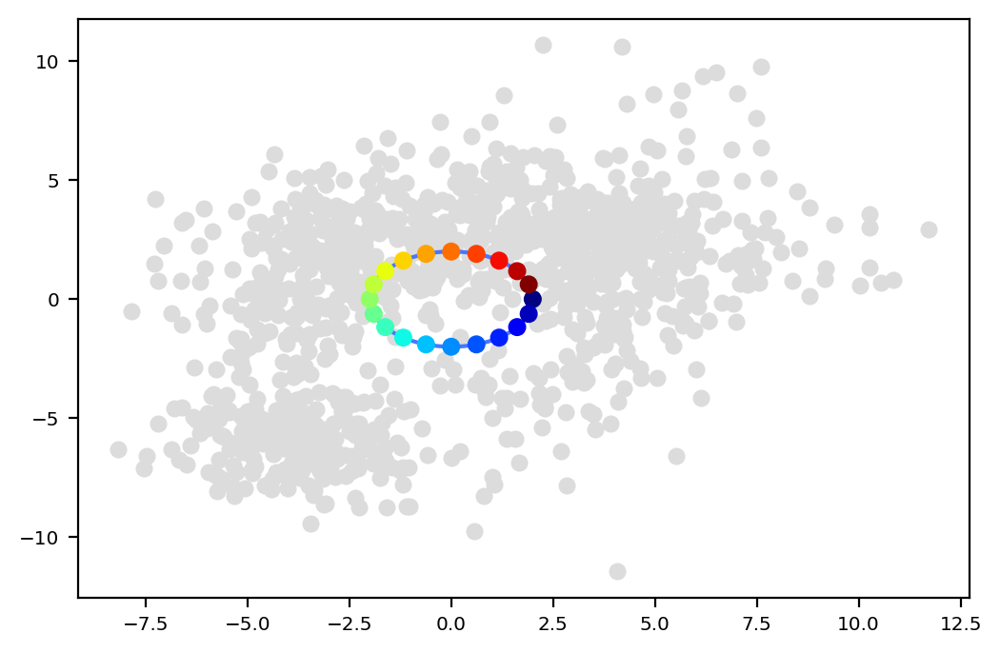

In [10]:
# approximate a circle
center_coords = np.mean(dose0[['DC1','DC2']])
#print(center_coords)
n_points = 20
radius = 2 
angles = np.linspace(0, -2*np.pi, n_points, endpoint=False)
x = center_coords[0] + radius * np.cos(angles)
y = center_coords[1] + radius * np.sin(angles)
theta = np.linspace(0, 2*np.pi, 400)
dot_color=np.arange(x.
                    shape[0])
plt.scatter(dose0['DC1'], dose0['DC2'], #c=dose0['CC'].map(colors3)
           c='gainsboro', zorder=1)
plt.scatter(x, y, c=dot_color, cmap='jet', s=40, label="Points", zorder=3)
plt.plot(center_coords[0] + radius * np.cos(theta),
        center_coords[1] + radius * np.sin(theta), label="Circle outline", zorder=2)
plt.show()

In [11]:
traj_arr = np.array(dose0[['DC1','DC2']])
initial_guess = np.concatenate([x[:,None], y[:,None]], axis=1)
root_state = initial_guess[0,:]
end_state = initial_guess[-1,:]
nrc = initial_guess.shape[0]

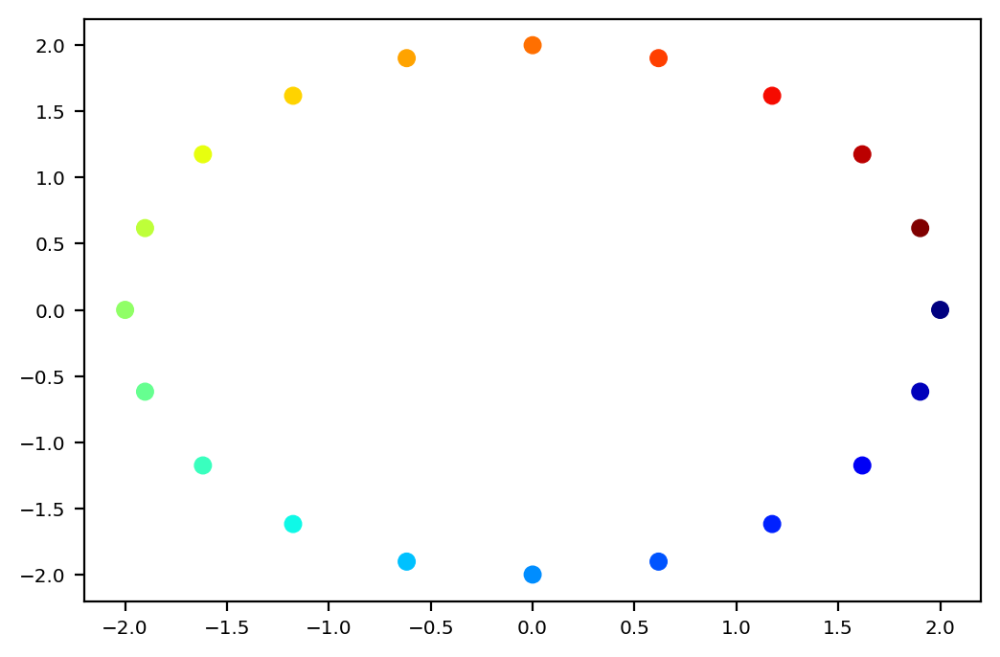

In [12]:
plt.scatter(x, y, c=dot_color, cmap='jet', s=40, label="Points", zorder=3)
plt.show()

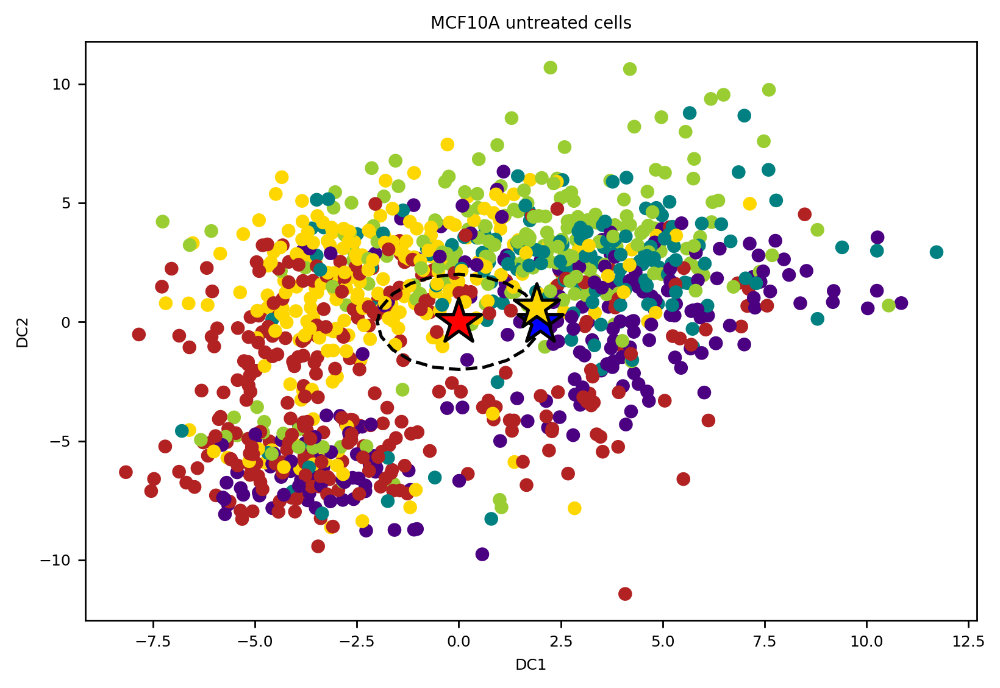

In [13]:
plt.figure(figsize=(7.5,5), dpi=125)
plt.scatter(dose0['DC1'], dose0['DC2'], c=dose0['CC'].map(colors3), zorder=1)
plt.scatter(root_state[0], root_state[1], color='blue', s=500, marker='*', linewidth=1.5, edgecolor='black', label='start', zorder=3)
plt.scatter(end_state[0], end_state[1], color='gold', s=500, marker='*', linewidth=1.5, edgecolor='black', label='end', zorder=3)
plt.scatter(center_coords[0], center_coords[1], color='red', s=500, marker='*', linewidth=1.5, edgecolor='black', zorder=2)
plt.plot(initial_guess[:,0], initial_guess[:,1], linestyle='dashed', c='black')
plt.xlabel('DC1')
plt.ylabel('DC2')
#plt.legend()
plt.title('MCF10A untreated cells')
#plt.savefig('../plots/new_CCC/untreated/string_method_start_and_endpoints.png',dpi=300)
plt.show()

In [14]:
FP=FindPath(dose0, initial_guess, "../plots/new_CCC/untreated/round1", nrc, traj_w=2,sf=1)
X0 = traj_arr
x1=root_state 
x2=end_state

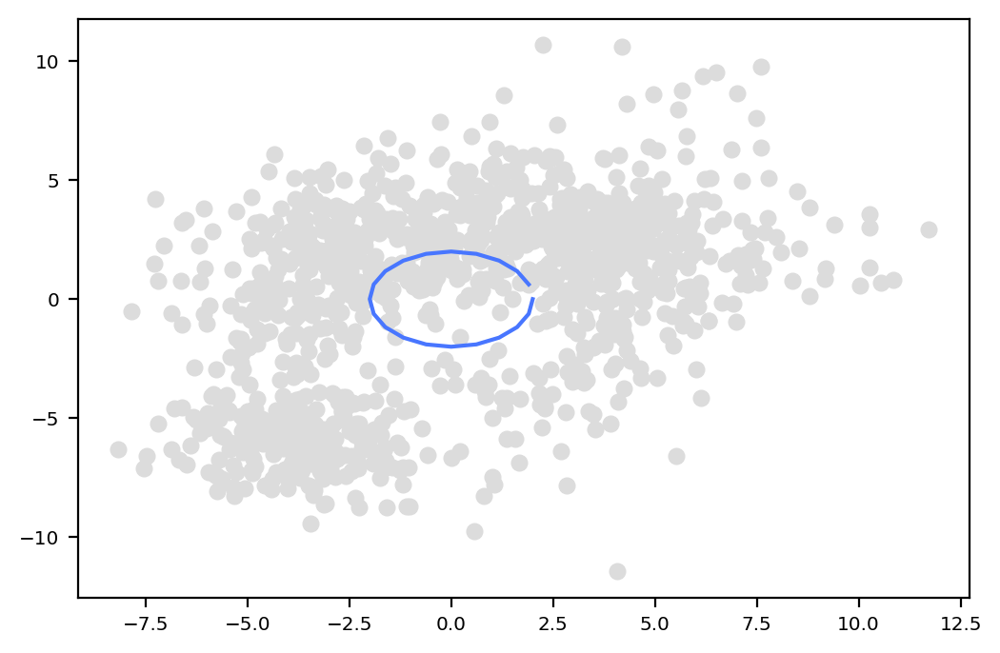

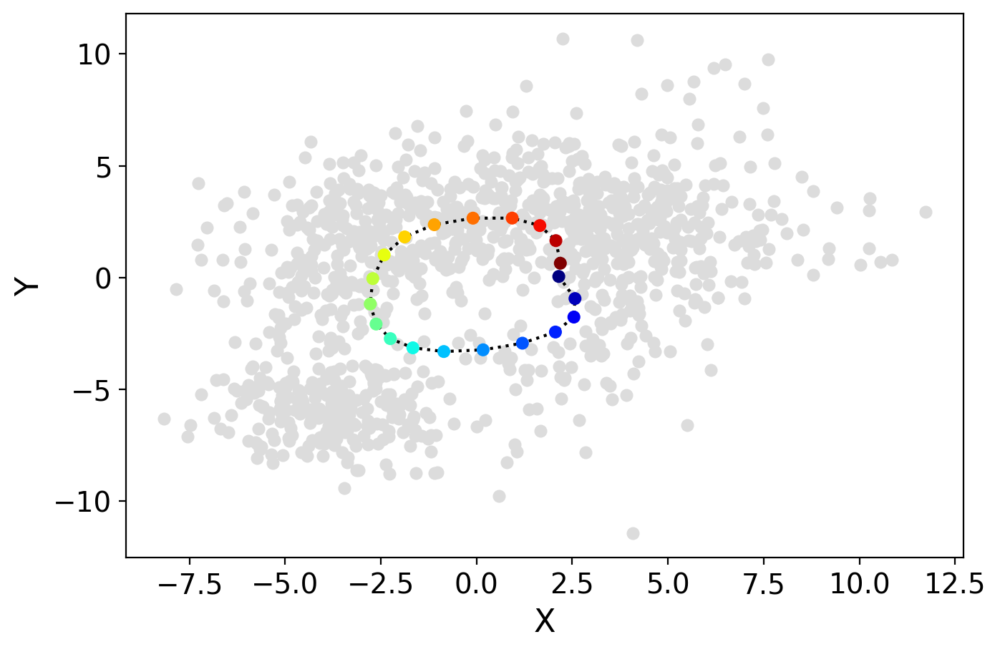

True


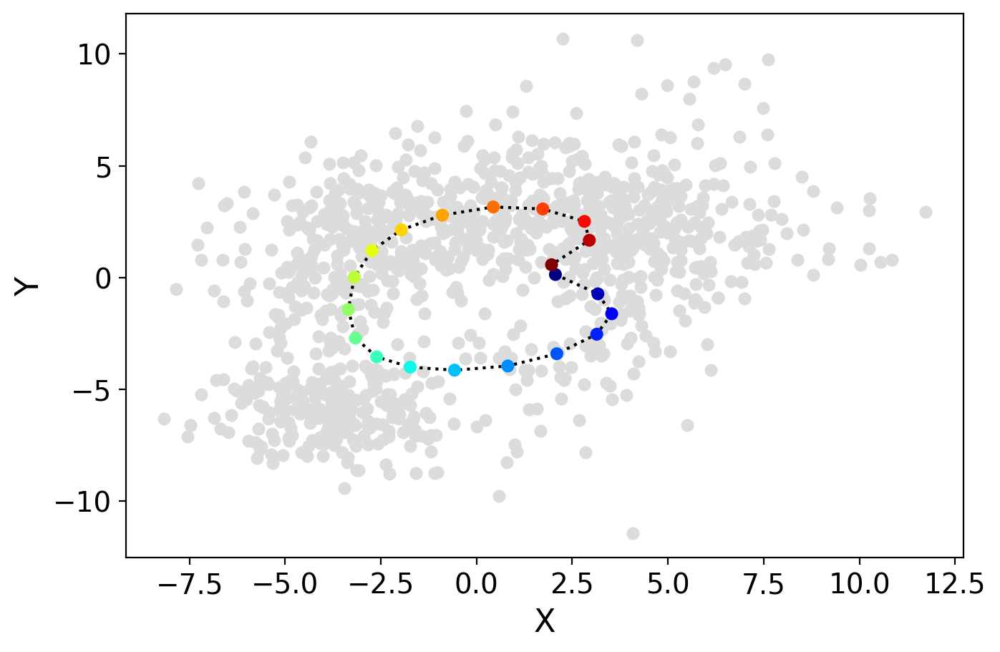

True


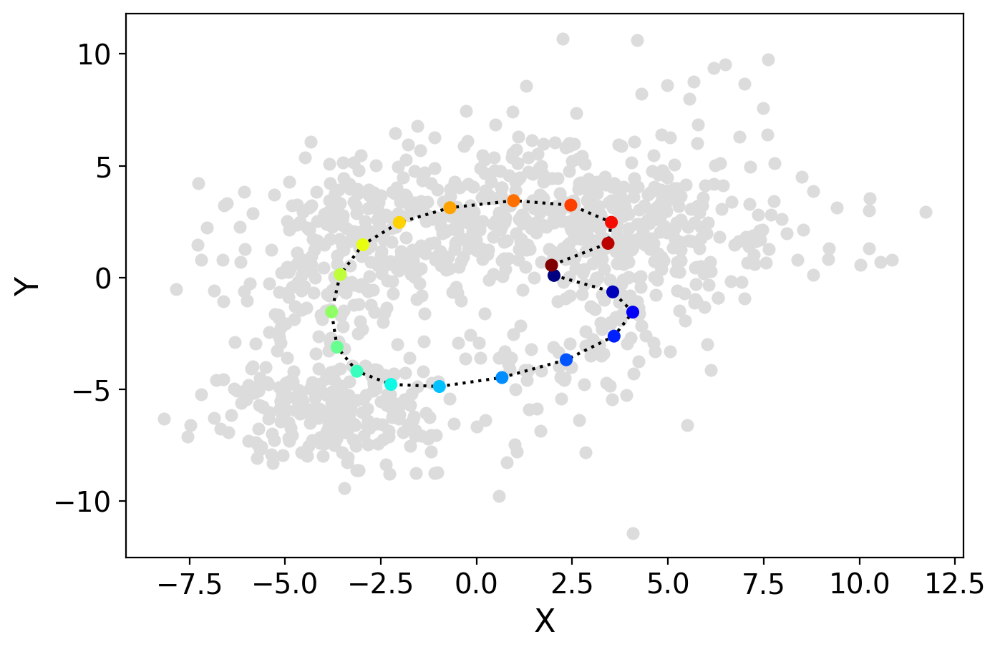

True


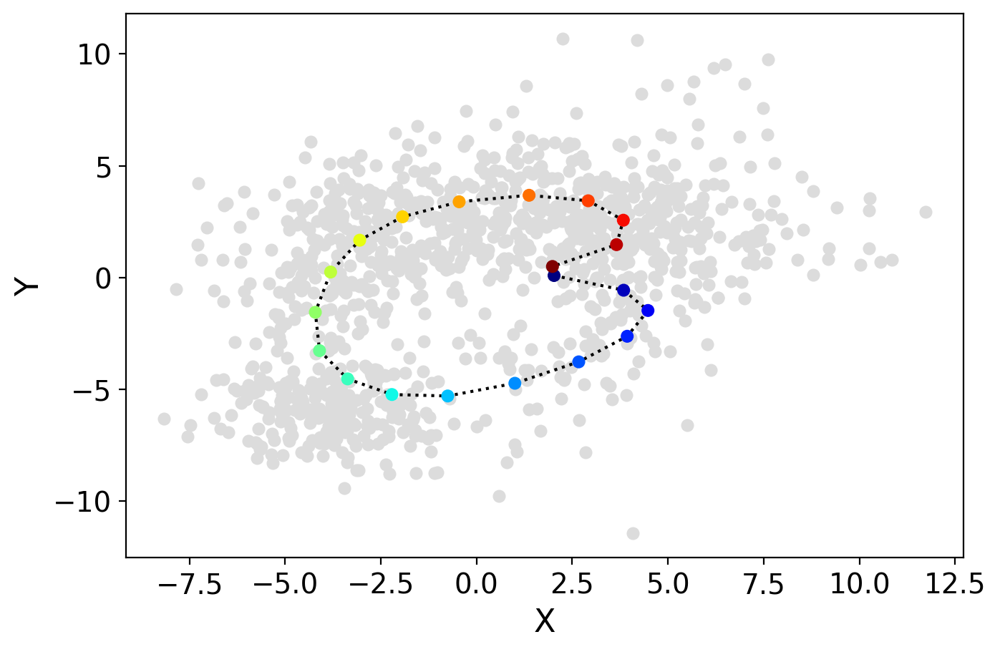

True


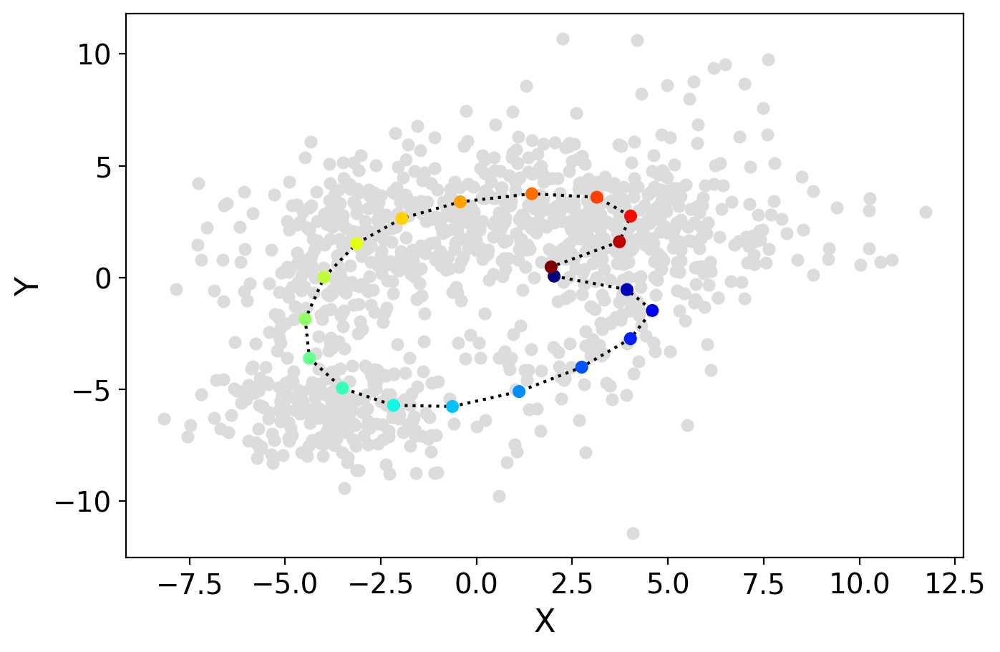

True


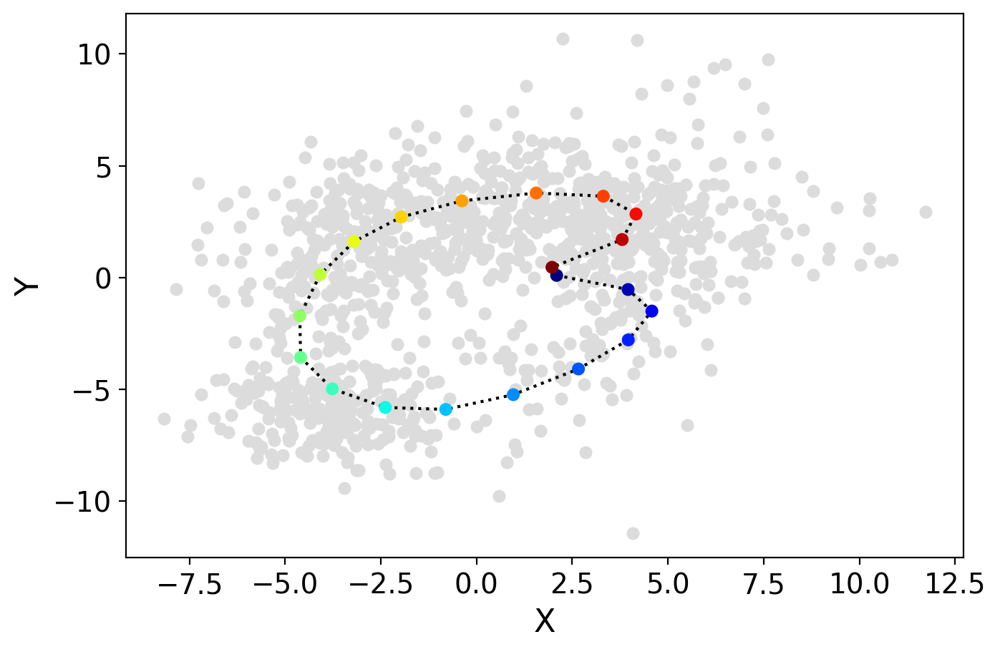

True


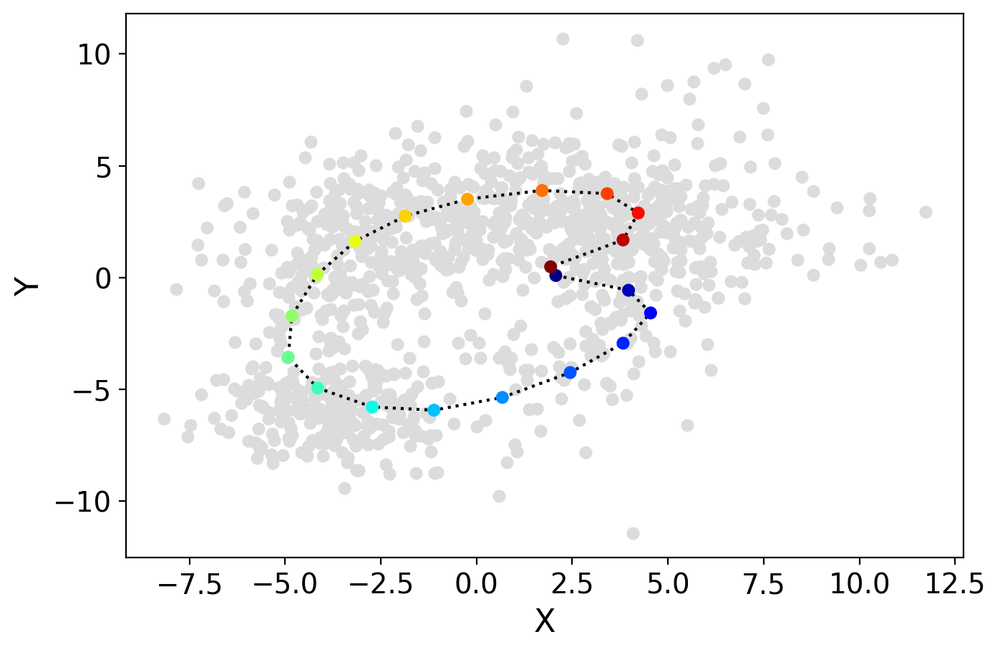

True


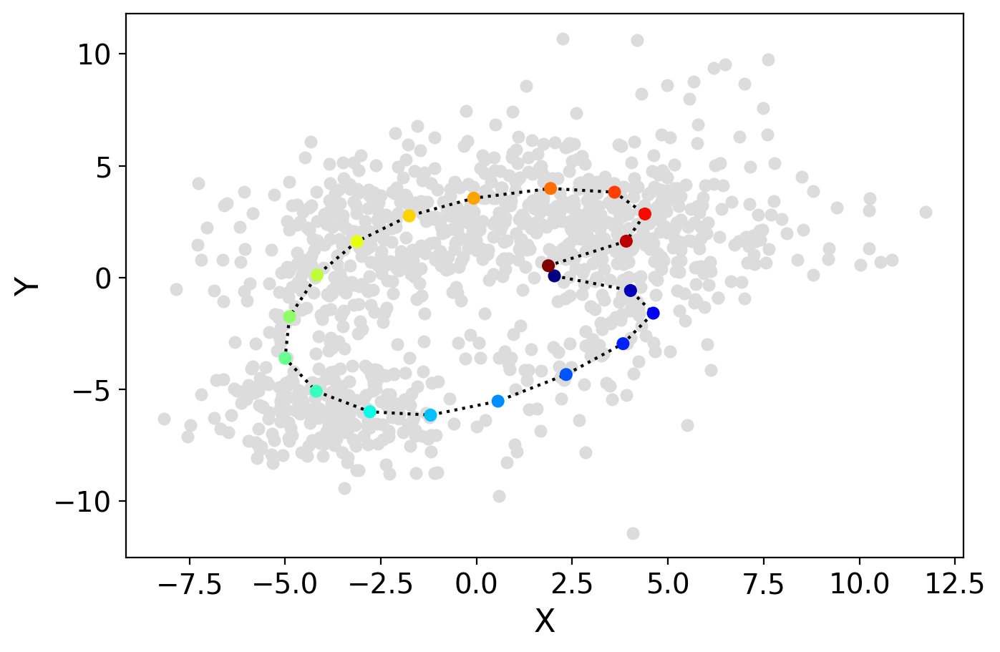

True


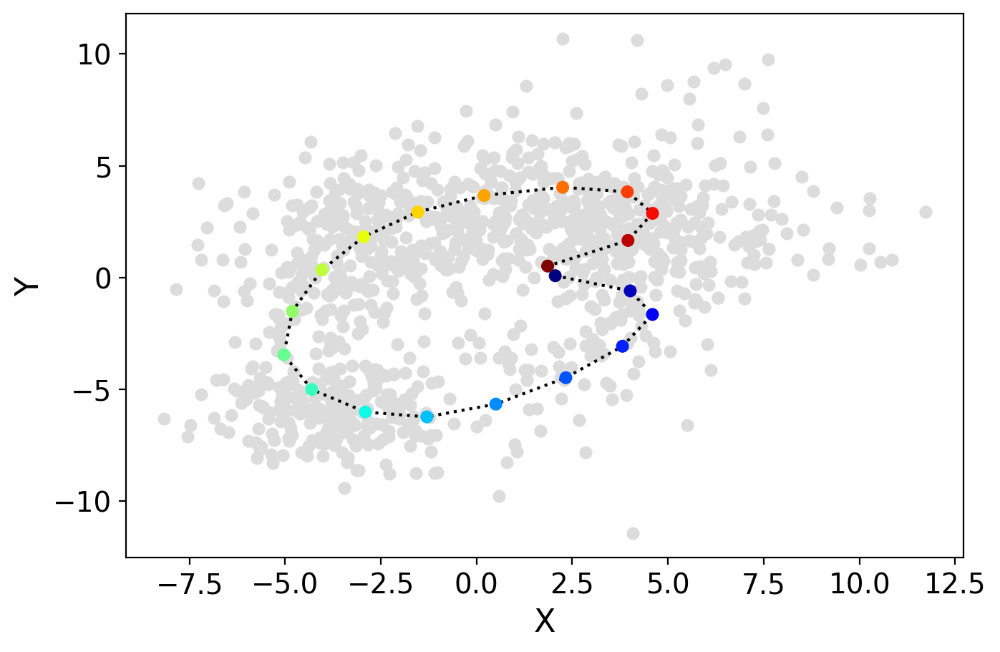

True


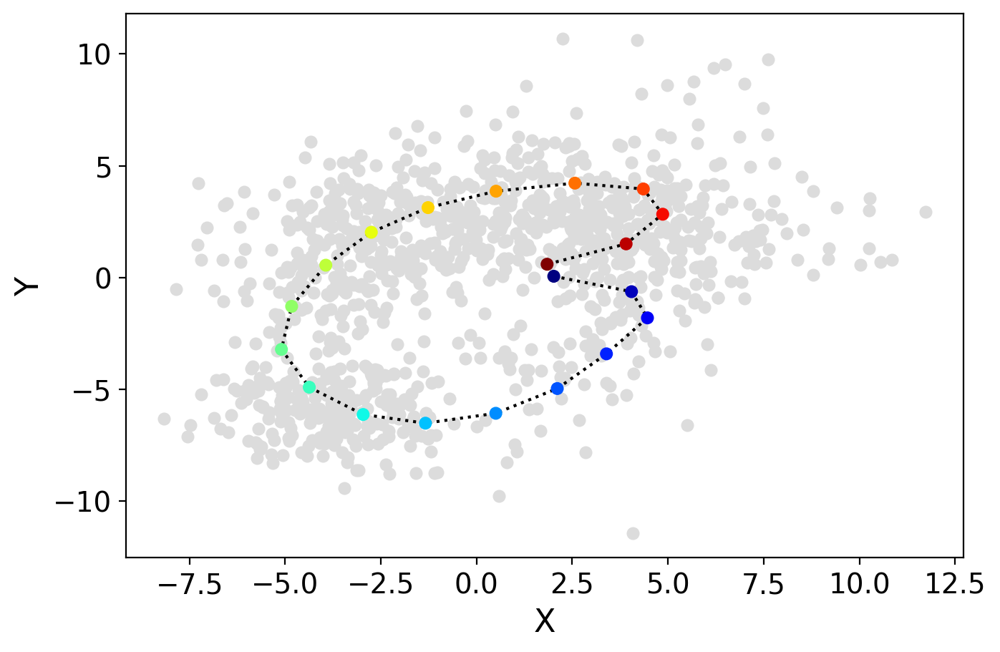

True


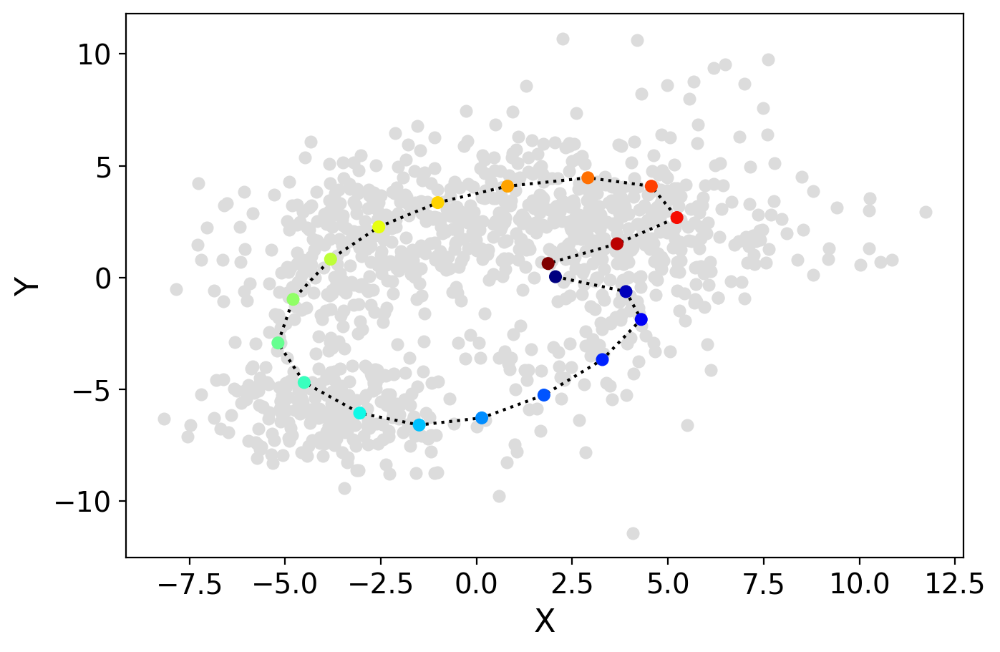

True


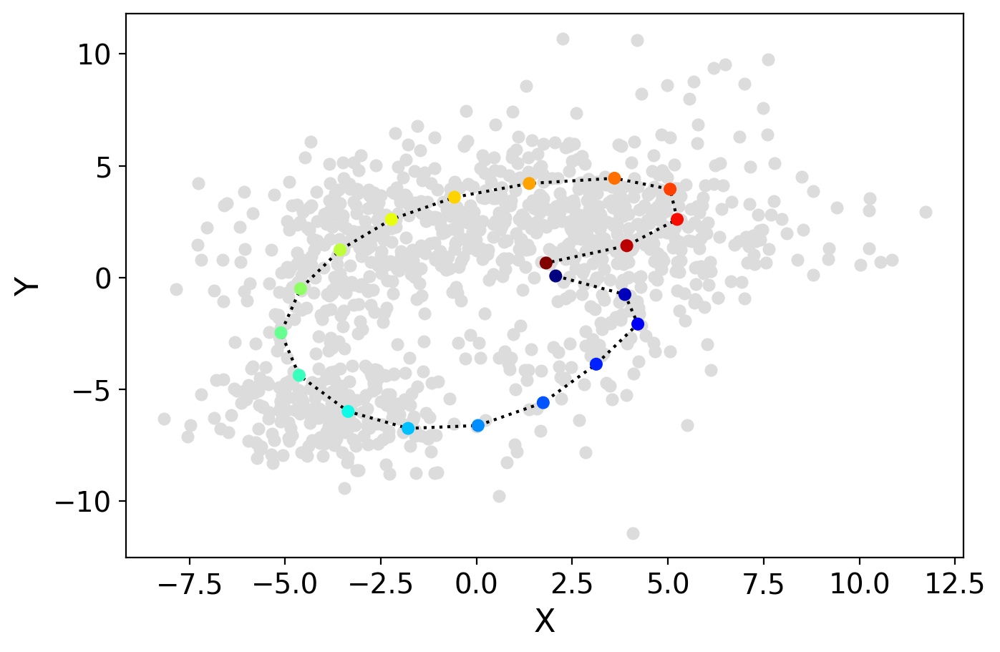

False


In [15]:
path0, data_rc0=FP.fit(x1,x2,[X0])

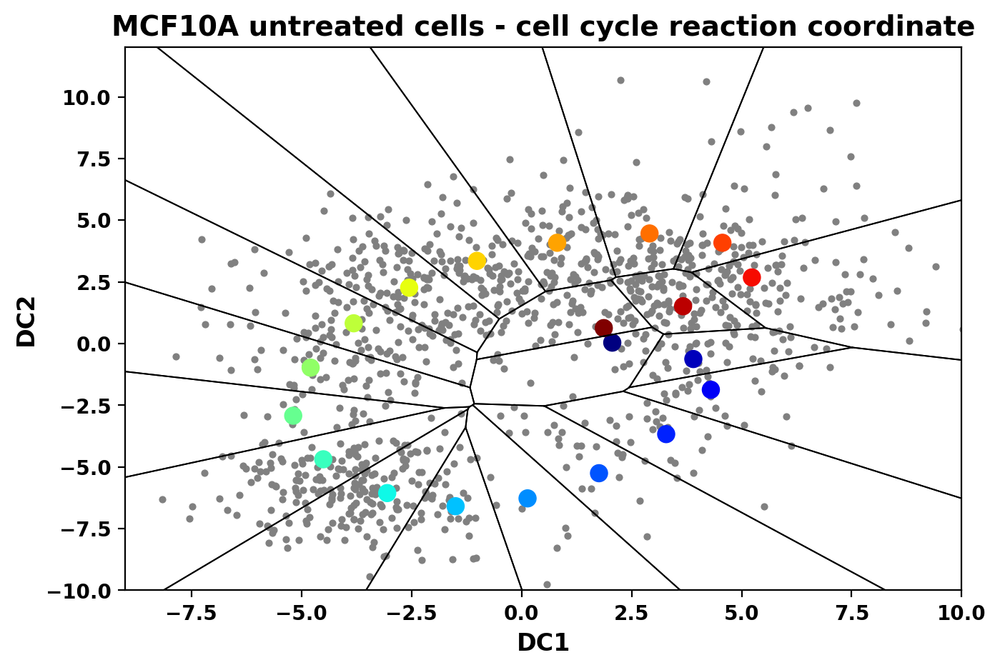

In [16]:
dot_color2=np.arange(path0.shape[0])
cm=plt.cm.get_cmap('jet')

fig,ax=plt.subplots(figsize=(7.5,5), dpi=100)
plt.scatter(dose0['DC1'], dose0['DC2'], s=10, color='grey')#,c=rho_w,cmap='viridis'

vor = Voronoi(path0[:,:2])
regions, vertices = voronoi_finite_polygons_2d(vor,radius=20)
for region in regions:
    polygon = vertices[region]
    for i in range(0,len(polygon)-1):
        plt.plot([polygon[i,0],polygon[i+1,0]], [polygon[i,1],polygon[i+1,1]], linewidth=0.7,color='k')
    plt.plot([polygon[-1,0],polygon[0,0]], [polygon[-1,1],polygon[0,1]],  linewidth=0.7,color='k')
    
plt.scatter(path0[:,0],path0[:,1],s=75,c=dot_color2,cmap=cm)
plt.xlabel('DC1',fontsize=12,fontweight='bold')
plt.ylabel('DC2',fontsize=12,fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.axis([-9,10,-10,12])
plt.title('MCF10A untreated cells - cell cycle reaction coordinate', fontsize=14,fontweight='bold')
plt.show()

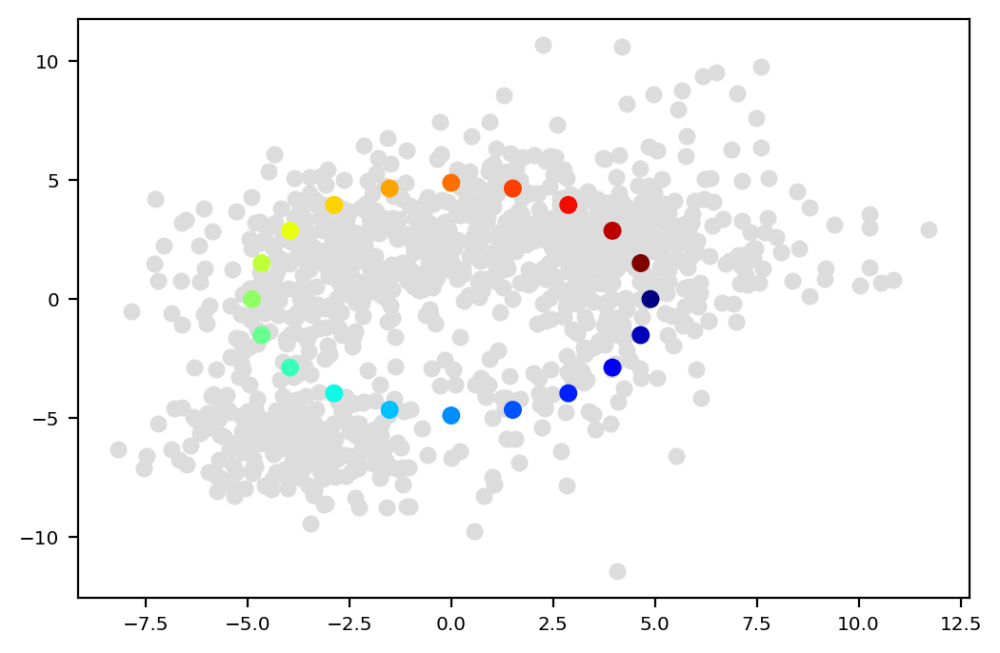

In [17]:
# approximate a circle
n_points = 20
rad = math.dist(center_coords, path0[int(path0.shape[0]/2),:])
angles = np.linspace(0, -2*np.pi, n_points, endpoint=False)
x = center_coords[0] + rad * np.cos(angles)
y = center_coords[1] + rad * np.sin(angles)
theta = np.linspace(0, 2*np.pi, 400)
dot_color=np.arange(x.
                    shape[0])
plt.scatter(dose0['DC1'], dose0['DC2'], #c=dose0['CC'].map(colors3)
           c='gainsboro', zorder=1)
plt.scatter(x, y, c=dot_color, cmap='jet', s=40, label="Points", zorder=3)
plt.show()

In [18]:
traj_arr = np.array(dose0[['DC1','DC2']])
second_guess = np.concatenate([x[:,None], y[:,None]], axis=1)
root_state = second_guess[0,:]
end_state = second_guess[-1,:]
nrc = second_guess.shape[0]

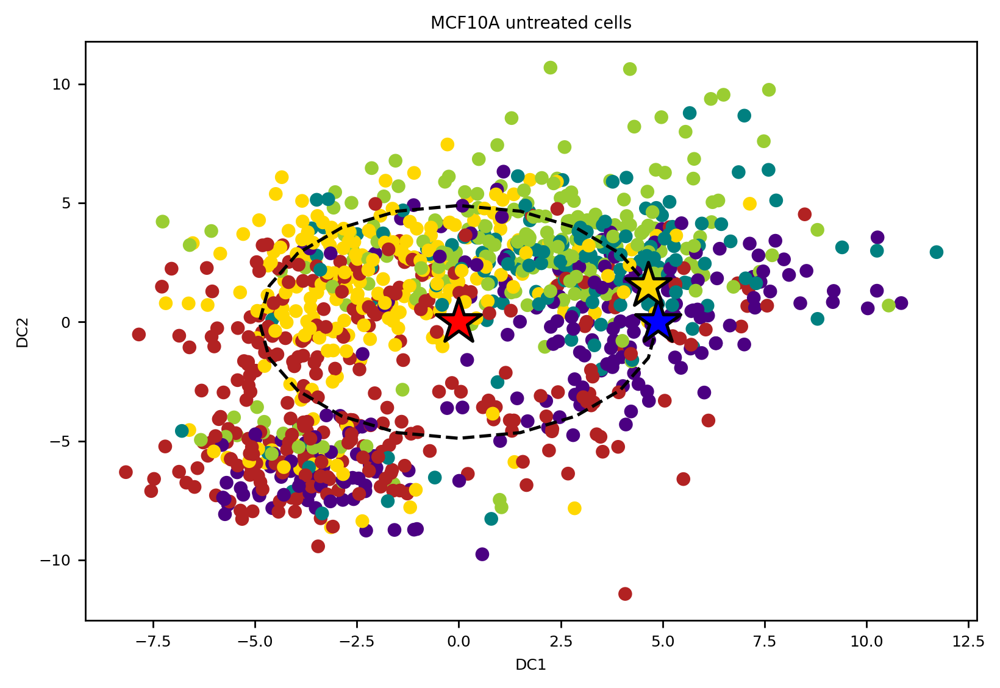

In [19]:
plt.figure(figsize=(7.5,5), dpi=125)
plt.scatter(dose0['DC1'], dose0['DC2'], c=dose0['CC'].map(colors3), zorder=1)
plt.scatter(root_state[0], root_state[1], color='blue', s=500, marker='*', linewidth=1.5, edgecolor='black', label='start', zorder=3)
plt.scatter(end_state[0], end_state[1], color='gold', s=500, marker='*', linewidth=1.5, edgecolor='black', label='end', zorder=3)
plt.scatter(center_coords[0], center_coords[1], color='red', s=500, marker='*', linewidth=1.5, edgecolor='black', zorder=2)
plt.plot(second_guess[:,0], second_guess[:,1], linestyle='dashed', c='black')
plt.xlabel('DC1')
plt.ylabel('DC2')
plt.title('MCF10A untreated cells')
#plt.savefig("../plots/new_CCC/dose12/"+'string_method_start_and_endpoints2.png',dpi=300)
plt.show()

In [20]:
FP=FindPath(dose0, second_guess, "../plots/new_CCC/untreated/round2", nrc,traj_w=2,sf=1)
X0 = traj_arr
root_state = second_guess[0,:]
end_state = second_guess[-1,:]
x1=root_state 
x2=end_state

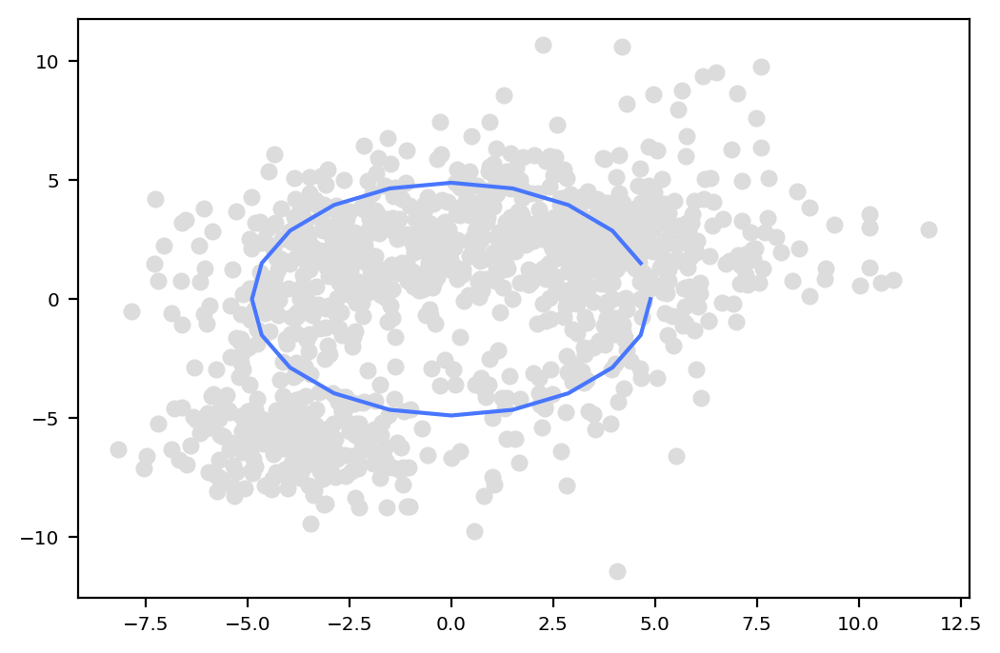

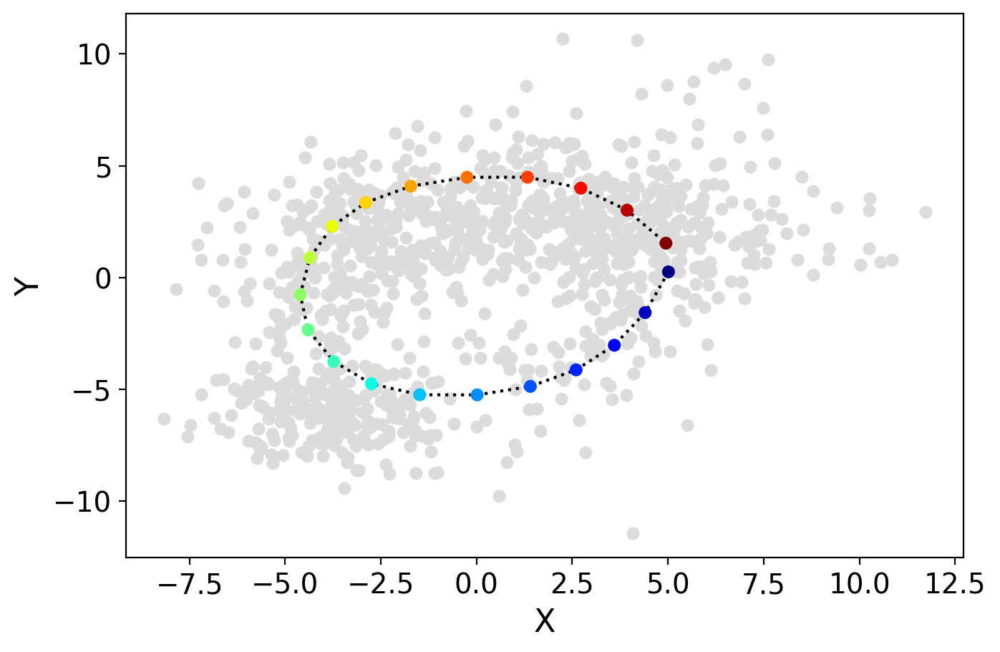

True


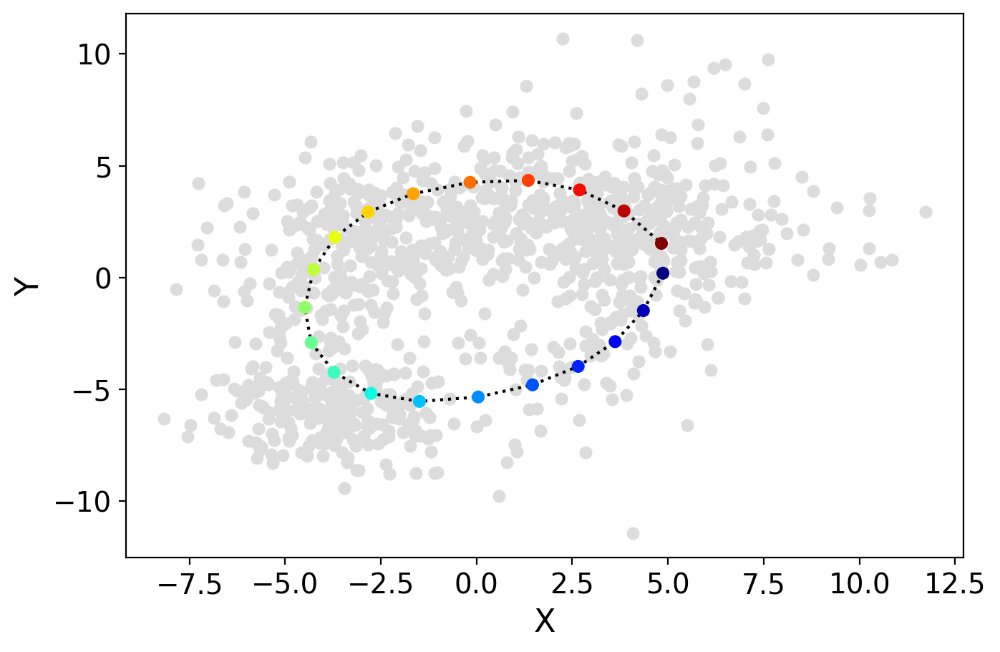

True


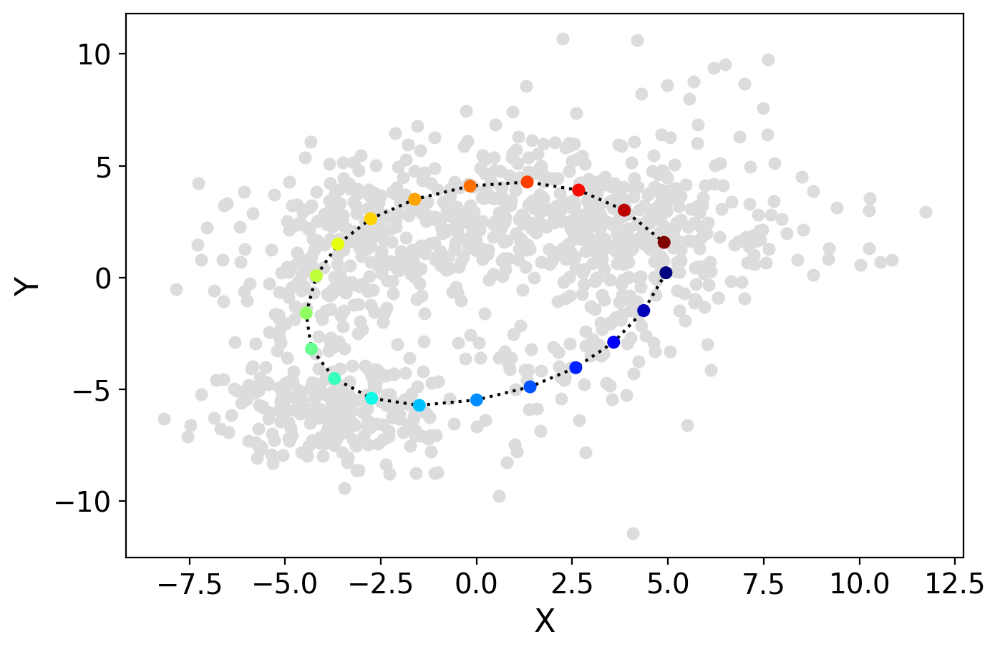

True


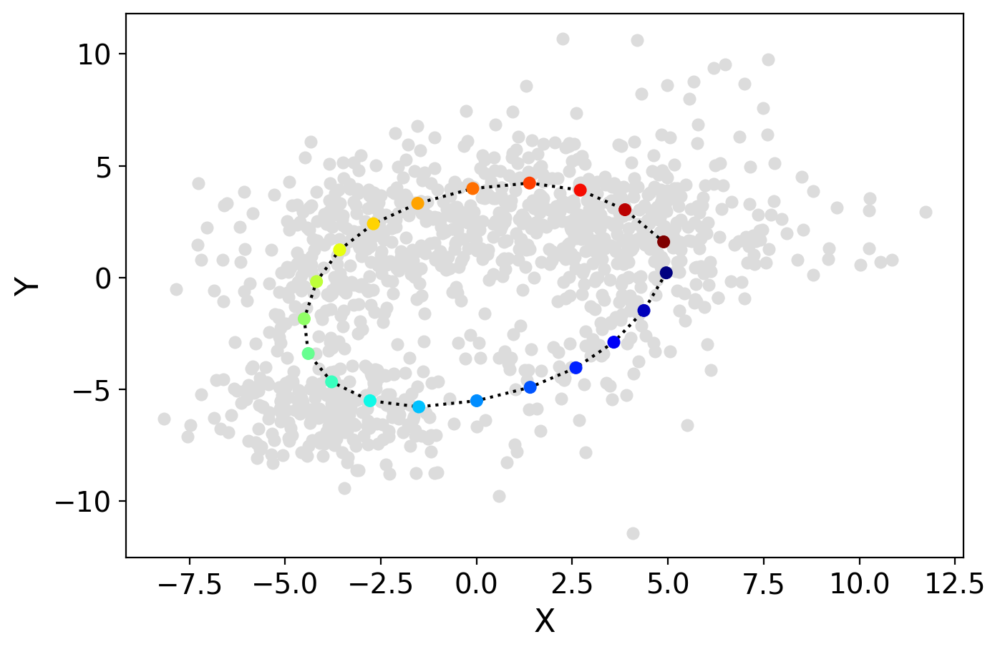

True


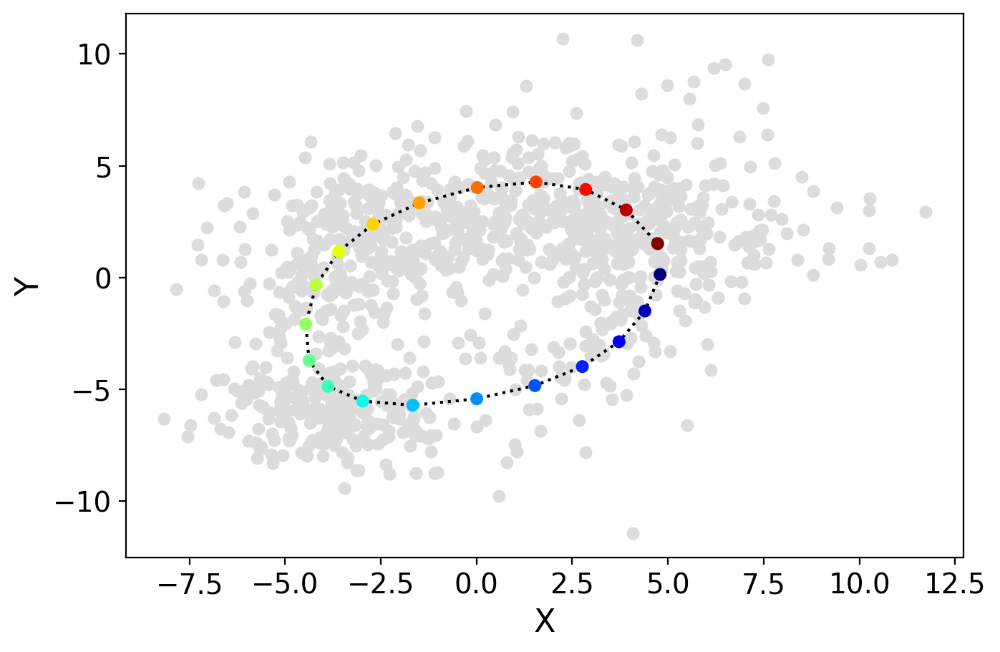

True


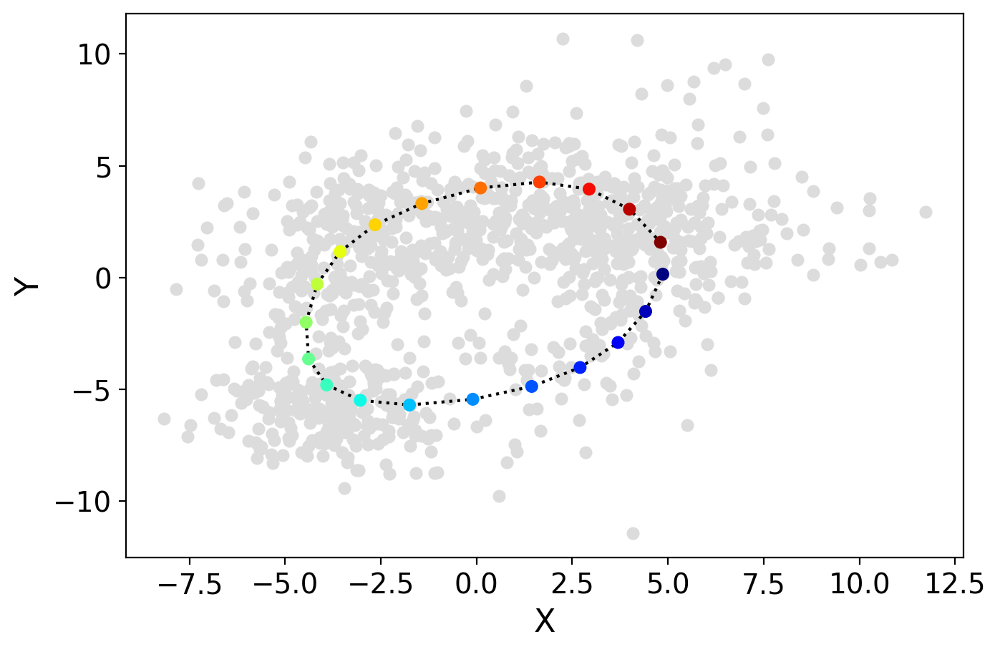

True


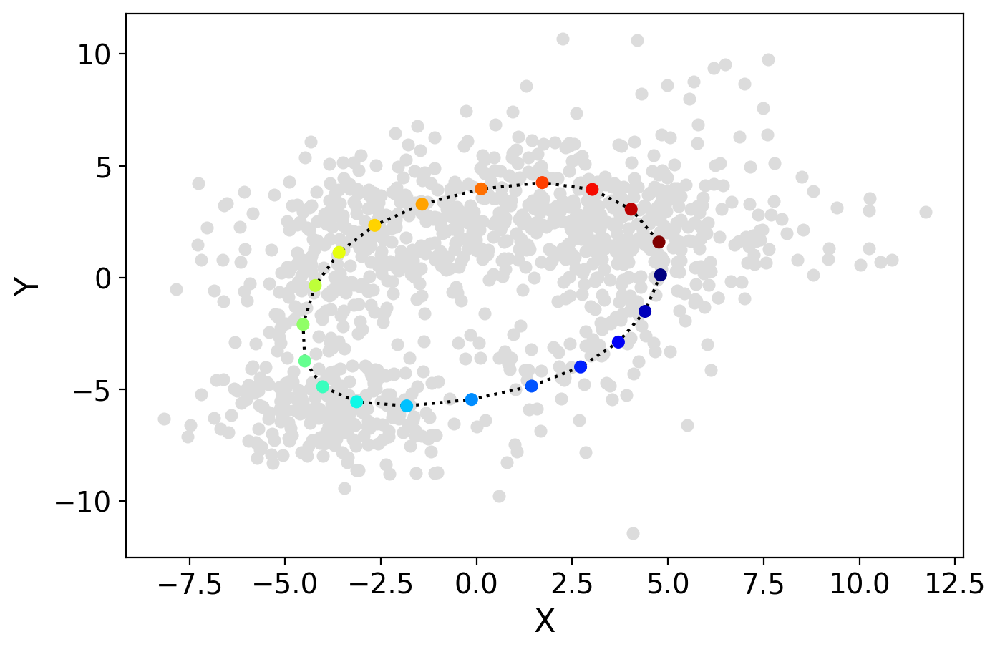

True


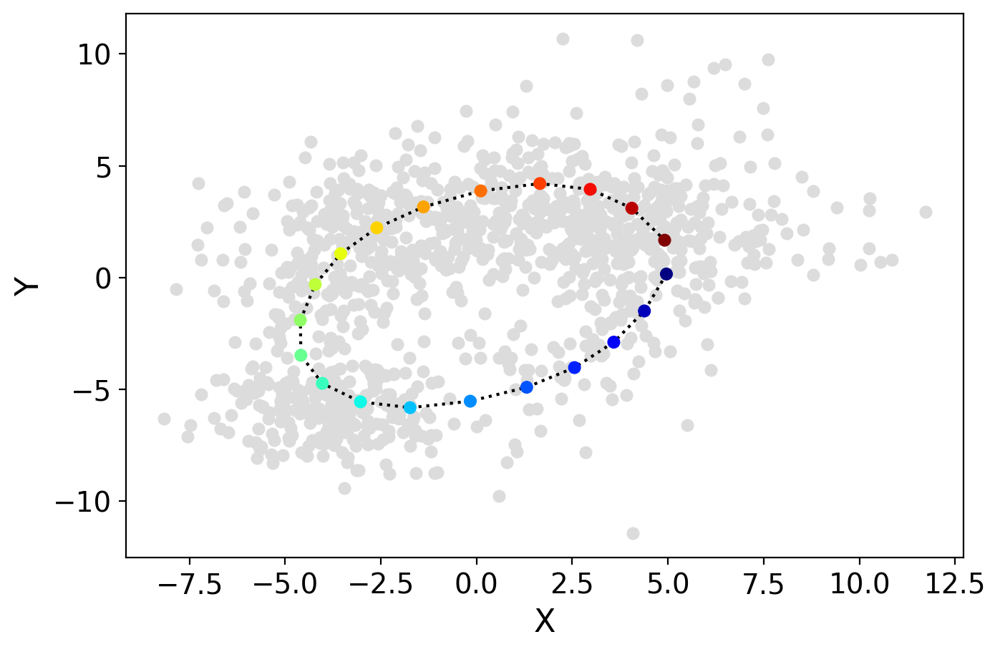

True


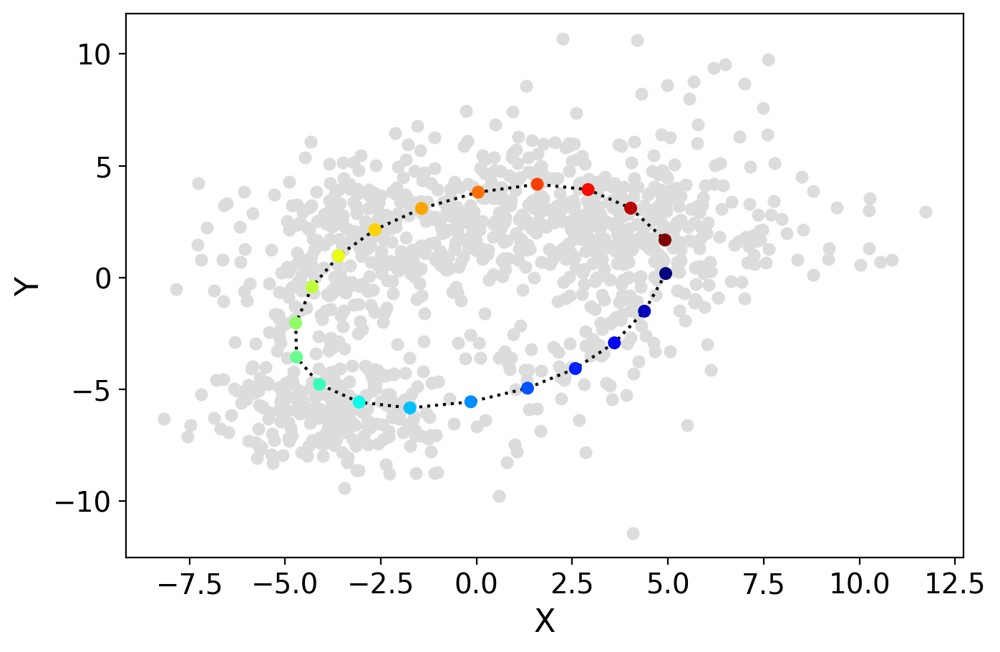

True


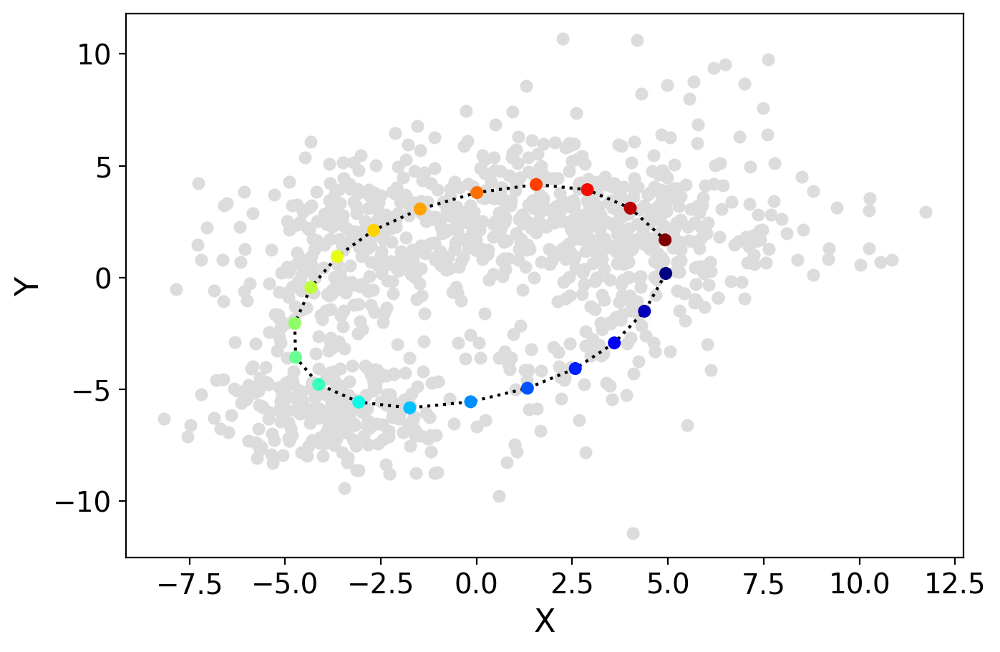

False


In [21]:
path1, data_rc0=FP.fit(x1,x2,[X0])

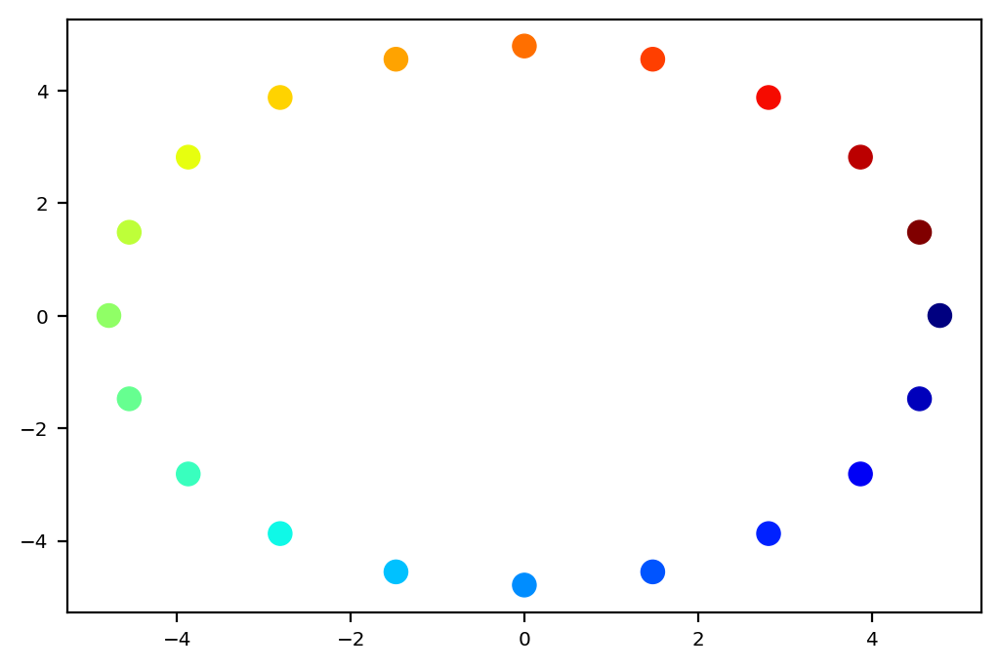

In [391]:
#plt.scatter(second_guess[:,0],second_guess[:,1],s=75,c=dot_color2,cmap=cm)

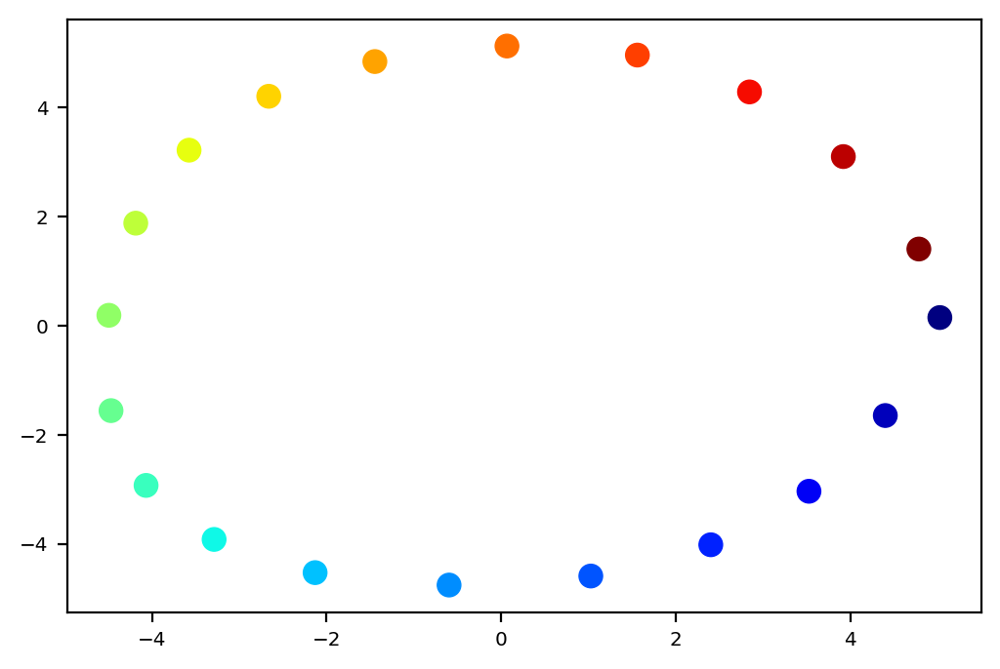

In [392]:
#plt.scatter(path1[:,0],path1[:,1],s=75,c=dot_color2,cmap=cm)

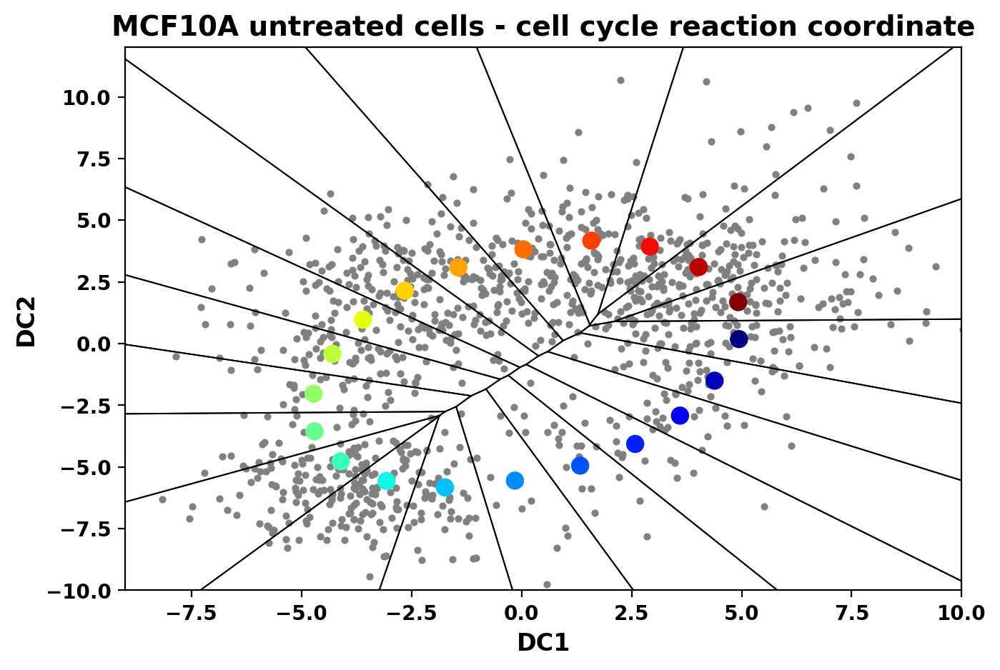

In [23]:
dot_color2=np.arange(path1.shape[0])
cm=plt.cm.get_cmap('jet')

fig,ax=plt.subplots(figsize=(7.5,5), dpi=100)
plt.scatter(dose0['DC1'], dose0['DC2'], s=10, color='grey')#,c=rho_w,cmap='viridis'

vor = Voronoi(path1[:,:2])
regions, vertices = voronoi_finite_polygons_2d(vor,radius=20)
for region in regions:
    polygon = vertices[region]
    for i in range(0,len(polygon)-1):
        plt.plot([polygon[i,0],polygon[i+1,0]], [polygon[i,1],polygon[i+1,1]], linewidth=0.7,color='k')
    plt.plot([polygon[-1,0],polygon[0,0]], [polygon[-1,1],polygon[0,1]],  linewidth=0.7,color='k')
    
plt.scatter(path1[:,0],path1[:,1],s=75,c=dot_color2,cmap=cm)
plt.xlabel('DC1',fontsize=12,fontweight='bold')
plt.ylabel('DC2',fontsize=12,fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.axis([-9,10,-10,12])

plt.title('MCF10A untreated cells - cell cycle reaction coordinate', fontsize=14,fontweight='bold')
plt.show()

In [394]:
#with open('generated-data/reaction-coordinate/dose0_regions', 'wb') as f:
# with open('../plots/new_CCC/untreated/untreated_regions', 'wb') as f:
#     pickle.dump(regions, f)

In [395]:
#with open('generated-data/reaction-coordinate/dose0_vertices', 'wb') as f:
# with open('../plots/new_CCC/untreated/untreated_vertices', 'wb') as f:
#     pickle.dump(vertices, f)

In [28]:
RC_regions = helper_functions.indicesToPolygon(regions, vertices)
dose0 = helper_functions.assignCoordsToReactionCoordinateRegions(dose0, RC_regions)

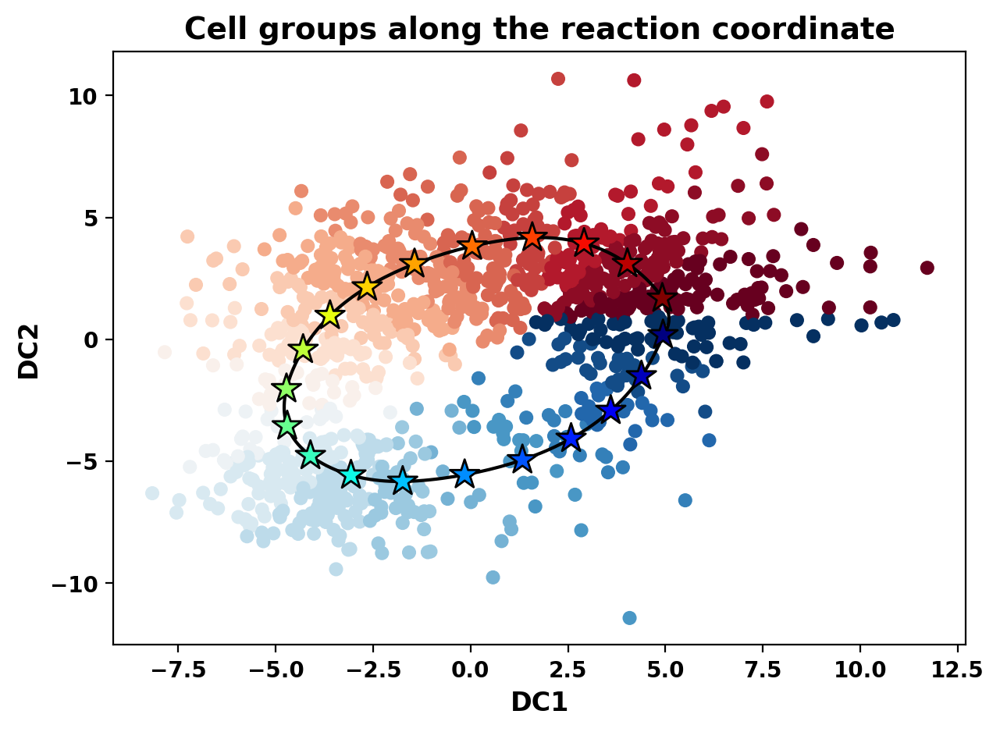

In [29]:
temp3 = np.vstack([path1, path1[0]])
x = temp3[:,0]
y = temp3[:,1]

t = np.arange(len(x))
ti = np.linspace(0, t.max(), 10 * t.size)

xi = interp1d(t, x, kind='cubic')(ti)
yi = interp1d(t, y, kind='cubic')(ti)

plt.figure(figsize = (7,5))

plt.scatter(dose0['DC1'], dose0['DC2'], c=dose0['RC region'], zorder=1)
plt.plot(xi, yi, color='black', zorder=2)
plt.scatter(path1[:,0],path1[:,1], c= np.arange(path1.shape[0]), cmap='jet' ,marker='*', s=200, edgecolor='black', linewidth=1, zorder=3)
plt.margins(0.05)
plt.xlabel('DC1',fontsize=12,fontweight='bold')
plt.ylabel('DC2',fontsize=12,fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.title('Cell groups along the reaction coordinate', fontsize=14,fontweight='bold')
#plt.savefig("../plots/new_CCC/dose12/" + 'dose_initial_reaction_coordinate2.png', transparent=True, dpi=300)
plt.show()

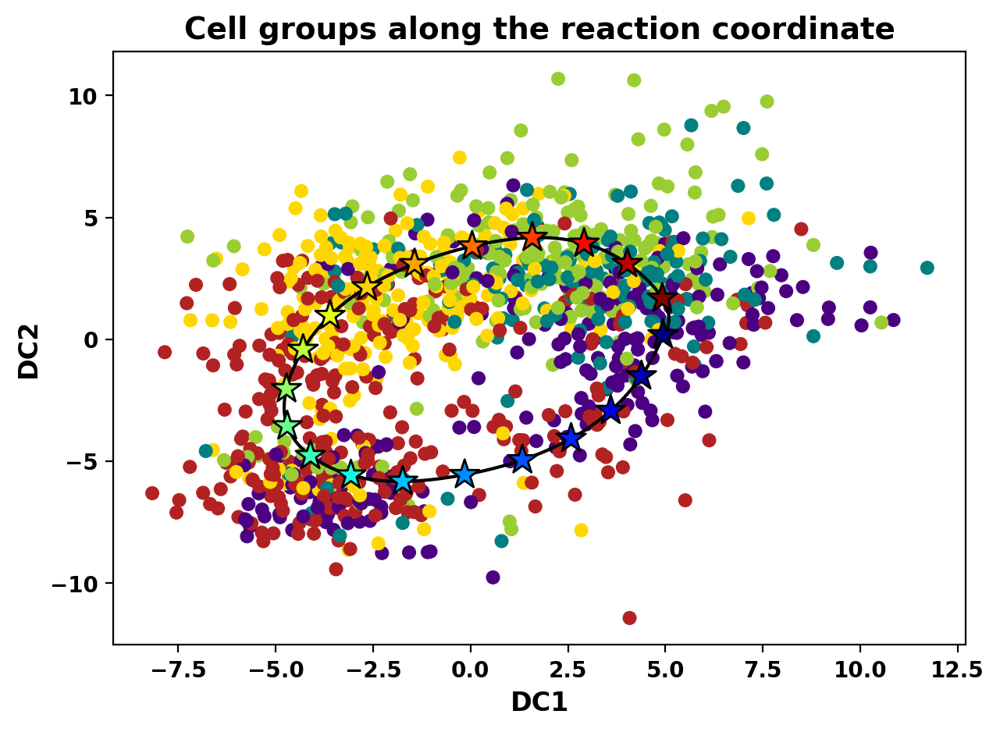

In [30]:
temp3 = np.vstack([path1, path1[0]])
x = temp3[:,0]
y = temp3[:,1]

t = np.arange(len(x))
ti = np.linspace(0, t.max(), 10 * t.size)

xi = interp1d(t, x, kind='cubic')(ti)
yi = interp1d(t, y, kind='cubic')(ti)

plt.figure(figsize = (7,5))

plt.scatter(dose0['DC1'], dose0['DC2'], c=dose0['CC'].map(colors3), zorder=1)
plt.plot(xi, yi, color='black', zorder=2)
plt.scatter(path1[:,0],path1[:,1], c= np.arange(path1.shape[0]), cmap='jet' ,marker='*', s=200, edgecolor='black', linewidth=1, zorder=3)
plt.margins(0.05)
plt.xlabel('DC1',fontsize=12,fontweight='bold')
plt.ylabel('DC2',fontsize=12,fontweight='bold')
plt.xticks(fontsize=10,fontweight='bold')
plt.yticks(fontsize=10,fontweight='bold')
plt.title('Cell groups along the reaction coordinate', fontsize=14,fontweight='bold')
#plt.savefig("../plots/new_CCC/dose12/" + 'dose_initial_reaction_coordinate2.png', transparent=True, dpi=300)
plt.show()

In [398]:
np.save('../plots/new_CCC/dose12/interp_xi.npy', xi)
np.save('../plots/new_CCC/dose12/interp_yi.npy', yi)

In [32]:
dose0 = helper_functions.assignPointsToReactionCoordinate(dose0, xi, yi)

In [33]:
dose0.columns

Index(['DC1', 'DC2', 'DC3', 'DC4', 'DC5', 'DC6', 'DC7', 'DC8', 'DC9', 'DC10',
       ...
       'FSTL1', 'MXRA7', 'GFPT2', 'RECK', 'TMEFF1', 'KS EMT score',
       'EMT score', 'final EMT score', 'RC region', 'RC nneighbor '],
      dtype='object', length=225)

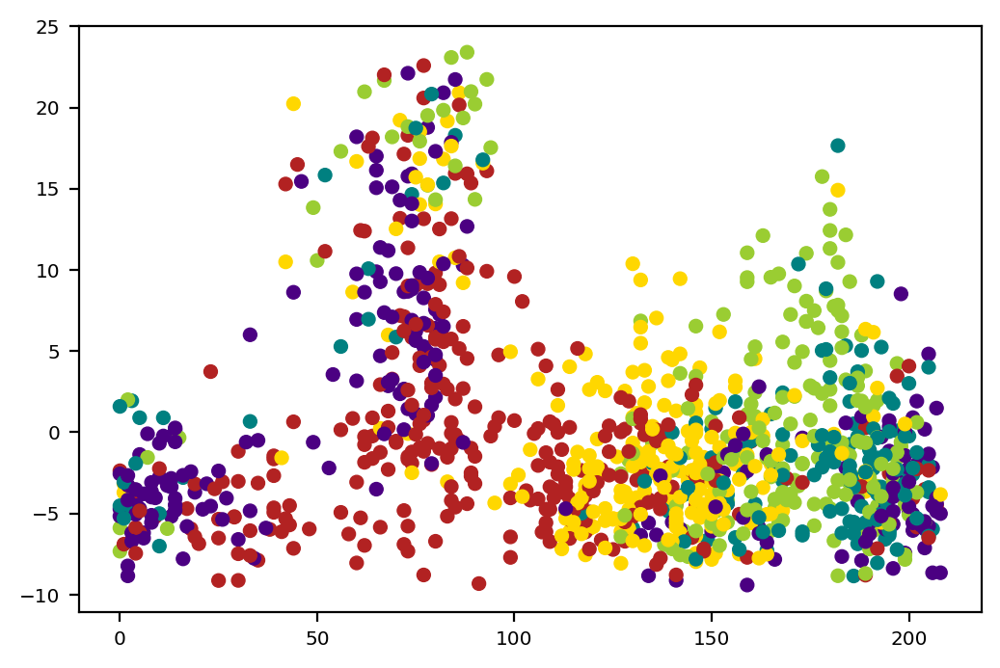

In [34]:
plt.scatter(dose0['RC nneighbor '],
            dose0['DC3'],
            c=dose0['CC'].map(colors3),
            s=25)

In [406]:
#dose0.to_csv("../plots/new_CCC/untreated/" + "DC_dose_0.csv")

In [50]:
dose0_df = pd.read_csv("../plots/new_CCC/untreated/" + "DC_dose_0.csv", index_col=0)

In [51]:
# shift coordinates
import copy
temp = copy.deepcopy(dose0_df['RC nneighbor '])
temp[temp > 35] = temp[temp > 35] - np.max(dose0_df['RC nneighbor '])

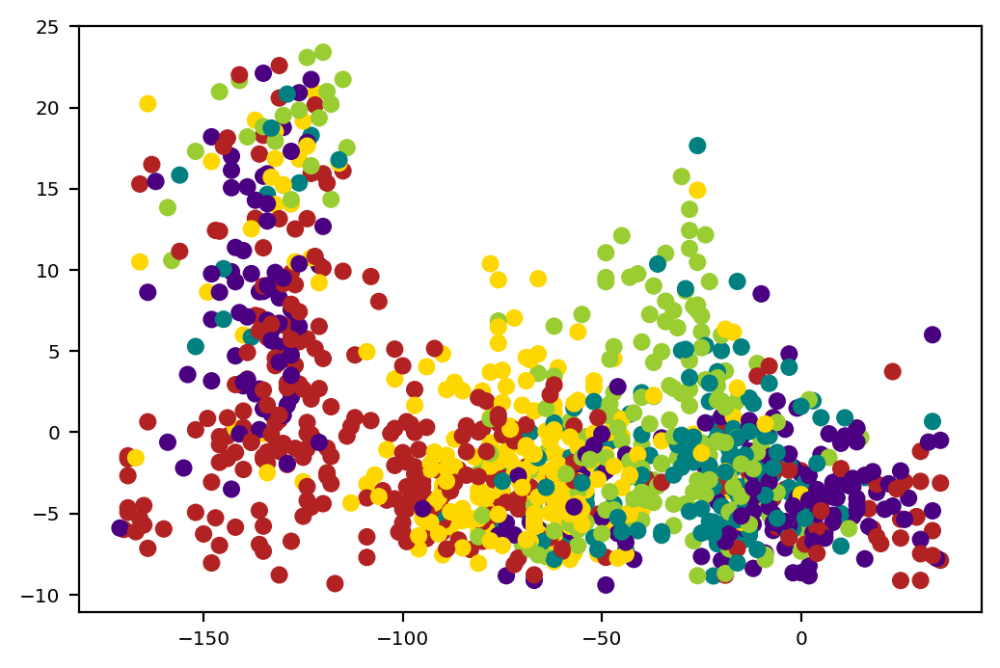

In [54]:
plt.scatter(temp,
            dose0_df['DC3'],
            c=dose0_df['CC'].map(colors3))

In [56]:
dose0_df['RC_adj'] = temp

# Obtain vector field

In [31]:
adata = dyn.read_loom("../../data/processed_possorted_genome_bam_RIG79.loom")
temp = np.empty((len(adata.obs),1), dtype=object)
temp.shape
for i in range(len(adata.obs)):
    temp[i] = str(int(float(adata.obs['dosage'][i])))
adata.obs['dosage'] = temp

In [36]:
additional_boundary_range = 0
i=0
dose = str(doses[i])
dose_adata = adata[(dose == adata.obs['dosage'])]

In [37]:
dose_adata.obs.index = dose_adata.obs['obs_names']

In [38]:
# Finding intersecting indexes between revelio and dataset
dose_index = dose_adata.obs.index
cc_index = dose0_df.index
cells_intersect = np.intersect1d(dose_index, cc_index)

In [39]:
new_adata = dose_adata[cells_intersect,:]
new_adata.obs.index = new_adata.obs['obs_names']
dose0_df = dose0_df.reindex(new_adata.obs.index)

cols = dose0_df.columns[2:9].tolist()
cols.insert(0, 'RC nneighbor ')

coords = np.array(dose0_df[cols])

dose0 = dose_adata[dose0_df.index,:]

In [40]:
dyn.pp.recipe_monocle(dose0, n_top_genes=2000, keep_filtered_genes=True)
dyn.tl.dynamics(dose0, model='deterministic', cores=3)
dyn.tl.reduceDimension(dose0, kwargs={})

|-----> apply Monocole recipe to adata...
|-----> <insert> pp to uns in AnnData Object.
|-----------> <insert> has_splicing to uns['pp'] in AnnData Object.
|-----------> <insert> has_labling to uns['pp'] in AnnData Object.
|-----------> <insert> splicing_labeling to uns['pp'] in AnnData Object.
|-----------> <insert> has_protein to uns['pp'] in AnnData Object.
|-----> ensure all cell and variable names unique.
|-----> ensure all data in different layers in csr sparse matrix format.
|-----> ensure all labeling data properly collapased
|-----------> <insert> tkey to uns['pp'] in AnnData Object.
|-----------> <insert> experiment_type to uns['pp'] in AnnData Object.
|-----> filtering cells...
|-----> filtering genes...


{'filter_bool': None, 'layer': 'all', 'min_cell_s': 11.13, 'min_cell_u': 5.565, 'min_cell_p': 5.565, 'min_avg_exp_s': 0, 'min_avg_exp_u': 0, 'min_avg_exp_p': 0, 'max_avg_exp': inf, 'min_count_s': 0, 'min_count_u': 0, 'min_count_p': 0, 'shared_count': 30}


|-----> calculating size factor...
|-----> selecting genes...


                      Accession  Chromosome       End     Start Strand  \
0             ENSG00000278704.1  GL000009.2     58376     56140      -   
1             ENSG00000277400.1  GL000194.1    115018     53590      -   
2             ENSG00000274847.1  GL000194.1    115055     53594      -   
3             ENSG00000277428.1  GL000195.1     37534     37434      -   
4             ENSG00000276256.1  GL000195.1     49164     42939      -   
...                         ...         ...       ...       ...    ...   
60663   ENSG00000237040.6_PAR_Y           Y  57062405  57062156      +   
60664  ENSG00000124333.16_PAR_Y           Y  57130289  57067865      +   
60665  ENSG00000124334.17_PAR_Y           Y  57197337  57184101      +   
60666   ENSG00000270726.6_PAR_Y           Y  57208756  57190738      +   
60667  ENSG00000182484.15_PAR_Y           Y  57212230  57207346      +   

          var_names  nCells  nCounts  pass_basic_filter  
0        BX004987.1       0      0.0              Fal

|-----> <insert> frac to var in AnnData Object.


sort by:  SVR
adata shape:  (1113, 60668)
adata shape:  (1113, 2000)
layer:  X
CM:  (1113, 2000)
CM:  (1113, 2000)
detected_bool:  [ True  True  True ...  True  True  True]
valid CM:  (1113, 2000)
mu:  [0.27694595 0.67267656 0.77179974 ... 0.28714246 0.07505931 1.0261239 ]
mu shape:  (2000,)
log_m:  [-1.8523237  -0.5720151  -0.37370154 ... -1.8001615  -3.735825
  0.03720491]


|-----> size factor normalizing the data, followed by log1p transformation.
|-----> applying PCA ...
|-----> <insert> pca_fit to uns in AnnData Object.
|-----> <insert> ntr to obs in AnnData Object.
|-----> <insert> ntr to var in AnnData Object.
|-----> cell cycle scoring...
|-----> computing cell phase...
|-----? 
Dynamo is not able to perform cell cycle staging for you automatically. 
Since dyn.pl.phase_diagram in dynamo by default colors cells by its cell-cycle stage, 
you need to set color argument accordingly if confronting errors related to this.
|
|-----> [recipe_monocle preprocess] finished [3.0254s]
|-----> calculating first/second moments begins...


X shape:  (1113, 30)
neighbors:  30
random_state:  RandomState(MT19937)
min_dist:  0.1
n_components:  2


|
|-----> [moments calculation] finished [11.6568s]
|-----> retrive data for non-linear dimension reduction...
|-----> perform umap...


{'kwargs': {}}
{'n_components': 2, 'metric': 'euclidean', 'min_dist': 0.5, 'spread': 1.0, 'n_epochs': 0, 'alpha': 1.0, 'gamma': 1.0, 'negative_sample_rate': 5, 'init_pos': 'spectral', 'random_state': 0, 'densmap': False, 'dens_lambda': 2.0, 'dens_frac': 0.3, 'dens_var_shift': 0.1, 'output_dens': False, 'verbose': False}
X shape:  (1113, 30)
neighbors:  30
random_state:  RandomState(MT19937)
min_dist:  0.5
n_components:  2


|
|-----> [dimension_reduction projection] finished [8.7451s]


In [41]:
dose0.obsm['X_DC'] = np.array(dose0_df[['DC1','DC2','DC3','DC4','DC5','DC6','DC7','DC8','DC9','DC10']])

In [42]:
dyn.tl.cell_wise_confidence(dose0)
dose0.obs.index = dose0.obs['obs_names']

X shape:  (1113, 30)
neighbors:  30
random_state:  RandomState(MT19937)
min_dist:  0.1
n_components:  2


In [57]:
#dose0.obsm['X_RC'] = np.array(dose0_df[['RC nneighbor ','DC3']].reindex(dose0.obs.index))
dose0.obsm['X_RC'] = np.array(dose0_df[['RC_adj','DC3']].reindex(dose0.obs.index))

In [45]:
dyn.tl.cell_velocities(dose0, basis = 'DC', enforce = True, method='pearson', other_kernels_dict={'transform': 'sqrt'}, correct_density = True)
dyn.vf.VectorField(dose0, basis='DC', M=1000)
#dyn.vf.topography(dose0, basis='RC_adj')

|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 100.0000%
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] finished [1.4206s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [0.5540s]
|-----> vectorfield calculation begins...
|-----> Retrieve X and V based on basis: DC. 
        Vector field will be learned in the DC space.
|-----> Learning vector field with method: sparsevfc.


V_emb:  (1113, 2)
neighs:  [[ 387  524  443 ...  518  642  161]
 [ 387  524  171 ...  431  463  161]
 [ 387  524  171 ...  431 1065  836]
 ...
 [ 639  333  479 ...  112 1078  181]
 [ 639  333  479 ...  112  181 1078]
 [ 639  333    8 ...  112  202 1028]]
X_grid:  (2500, 2)
V_grid:  (2500, 2)
mass:  [[7.69374457e-089 1.01599071e-079 3.86188605e-072 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 [7.24930652e-075 9.56012717e-066 3.50824681e-058 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 [4.66395815e-062 1.06811859e-053 3.89925352e-046 ... 0.00000000e+000
  0.00000000e+000 0.00000000e+000]
 ...
 [1.67509090e-142 3.90281472e-128 2.51434188e-115 ... 8.17530322e-055
  1.04242989e-068 3.67533287e-084]
 [8.39358558e-160 1.95562865e-145 1.25989046e-132 ... 9.38733650e-057
  1.19697580e-070 4.22022101e-086]
 [0.00000000e+000 0.00000000e+000 7.48964373e-152 ... 1.27879467e-060
  1.63058635e-074 5.74901747e-090]]
min_mass:  1e-05
cutoff:  (50, 50)
V_grid: (2, 50, 50)
cutoff:  

|-----> <insert> velocity_DC_SparseVFC to obsm in AnnData Object.
|-----> <insert> X_DC_SparseVFC to obsm in AnnData Object.
|-----> <insert> VecFld_DC to uns in AnnData Object.
|-----> <insert> control_point_DC to obs in AnnData Object.
|-----> <insert> inlier_prob_DC to obs in AnnData Object.
|-----> <insert> obs_vf_angle_DC to obs in AnnData Object.
|
|-----> [VectorField] finished [8.3052s]


In [58]:
dyn.tl.cell_velocities(dose0, basis = 'RC', enforce = True, method='pearson', other_kernels_dict={'transform': 'sqrt'}, correct_density = True)
dyn.vf.VectorField(dose0, basis='RC', M=1000)
#dyn.vf.topography(dose0, basis='RC_adj')

|-----> [calculating transition matrix via pearson kernel with sqrt transform.] in progress: 100.0000%
|-----> [calculating transition matrix via pearson kernel with sqrt transform.] finished [3.2072s]
|-----> [projecting velocity vector to low dimensional embedding] in progress: 100.0000%
|-----> [projecting velocity vector to low dimensional embedding] finished [0.8316s]
|-----> vectorfield calculation begins...
|-----> Retrieve X and V based on basis: RC. 
        Vector field will be learned in the RC space.
|-----> Generating high dimensional grids and convert into a row matrix.
|-----> Learning vector field with method: sparsevfc.


V_emb:  (1113, 2)
neighs:  [[ 885  369  968 ...  593    9  224]
 [ 369 1002  885 ...  266  224    9]
 [ 951  687 1002 ...  224  468    9]
 ...
 [ 699   68  360 ...  869  871  325]
 [ 699   68  360 ...  688  245  786]
 [ 699  360    2 ...  118  727  871]]
X_grid:  (2500, 2)
V_grid:  (2500, 2)
mass:  [[1.46075864e-01 7.86664161e-01 6.00804249e+00 ... 5.63337687e+00
  6.20658383e+00 1.08972507e+00]
 [6.81360176e-01 3.62813101e+00 1.71846464e+01 ... 8.08181093e+00
  1.28465382e+01 2.14863156e+00]
 [2.35130307e+00 1.26909217e+01 3.80623624e+01 ... 1.05109212e+01
  2.08539281e+01 3.13695982e+00]
 ...
 [3.55755262e-11 7.63880208e-03 1.12277798e+01 ... 3.49038343e-40
  2.39216722e-37 1.10755686e-39]
 [1.17529974e-11 2.55341641e-03 3.75318254e+00 ... 2.15955768e-43
  1.48007323e-40 6.85263661e-43]
 [2.90066147e-12 6.31024390e-04 9.27522427e-01 ... 9.87793735e-47
  6.76993757e-44 3.13443422e-46]]
min_mass:  1e-05
cutoff:  (50, 50)
V_grid: (2, 50, 50)
cutoff:  [[False False False ... False False 

|-----> <insert> velocity_RC_SparseVFC to obsm in AnnData Object.
|-----> <insert> X_RC_SparseVFC to obsm in AnnData Object.
|-----> <insert> VecFld_RC to uns in AnnData Object.
|-----> <insert> control_point_RC to obs in AnnData Object.
|-----> <insert> inlier_prob_RC to obs in AnnData Object.
|-----> <insert> obs_vf_angle_RC to obs in AnnData Object.
|
|-----> [VectorField] finished [9.9859s]


In [46]:
i=0
additional_boundary_range = 0
CC = dose0_df['CC']
CC.index = dose0.obs.index
dose0.obs['CC'] = CC

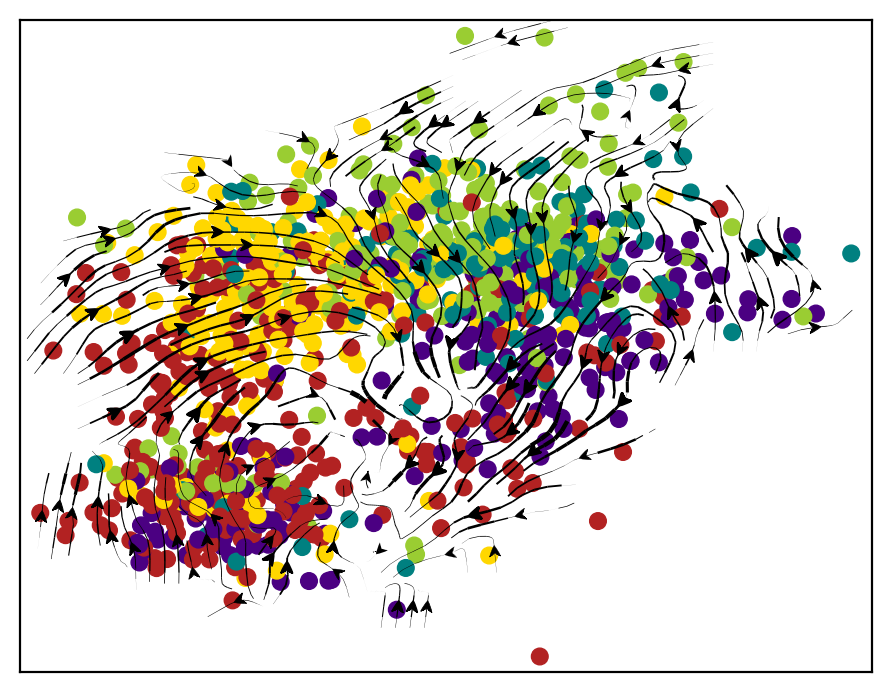

In [78]:
plt.figure(figsize=(4.5,3.5))
plt.scatter(dose0.obsm['X_DC'][:,0],
            dose0.obsm['X_DC'][:,1],
            c=dose0.obs['CC'].map(colors3))
dyn.pl.zstreamline(dose0, basis='DC')
#plt.ylim(-12, 25)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
#plt.savefig("../plots/new_CCC/untreated/dose0_DC_vf.png", dpi=300)

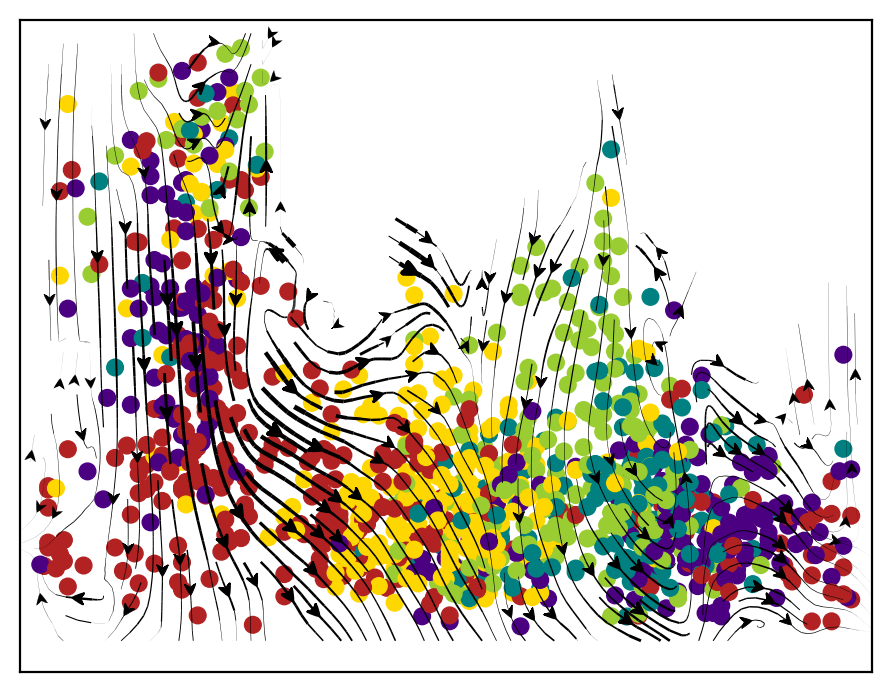

In [59]:
plt.figure(figsize=(4.5,3.5))
plt.scatter(dose0.obsm['X_RC'][:,0],
            dose0.obsm['X_RC'][:,1],
            c=dose0.obs['CC'].map(colors3))
dyn.pl.zstreamline(dose0, basis='RC')
plt.ylim(-12, 25)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
#plt.savefig("../plots/new_CCC/untreated/cc_emt_rep/dose0_vf.png", dpi=300)

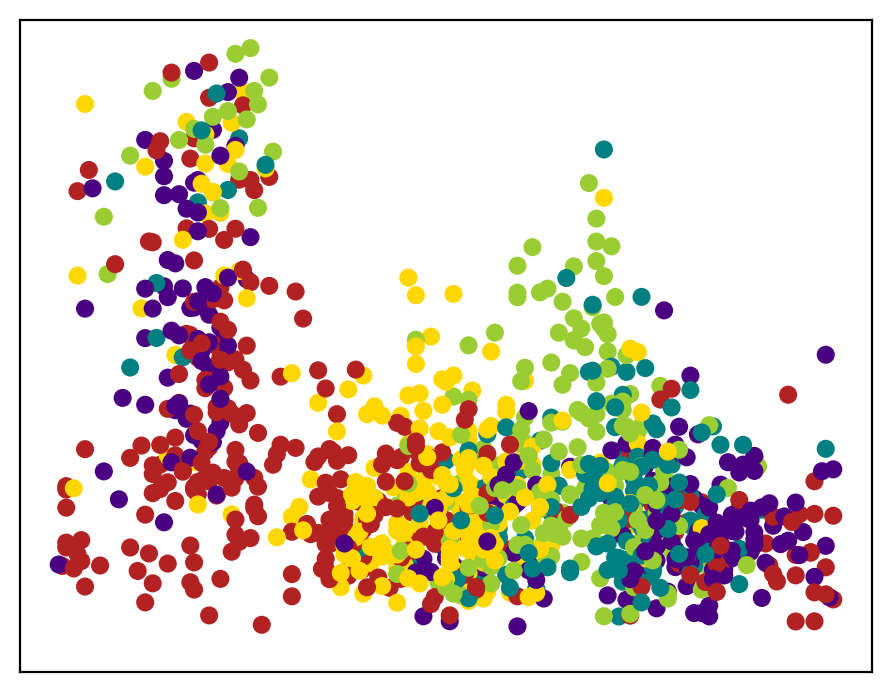

In [60]:
plt.figure(figsize=(4.5,3.5))
plt.scatter(dose0.obsm['X_RC'][:,0],
            dose0.obsm['X_RC'][:,1],
            c=dose0.obs['CC'].map(colors3))
#dyn.pl.zstreamline(dose12, basis='RC')
plt.ylim(-12, 25)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
#plt.savefig("../plots/new_CCC/untreated/cc_emt_rep/dose0_CC_EMT.png", dpi=300)

# Plot expression

In [427]:
X_data = dose0.X.toarray()

In [428]:
dose0.var.index = dose0.var['var_names']

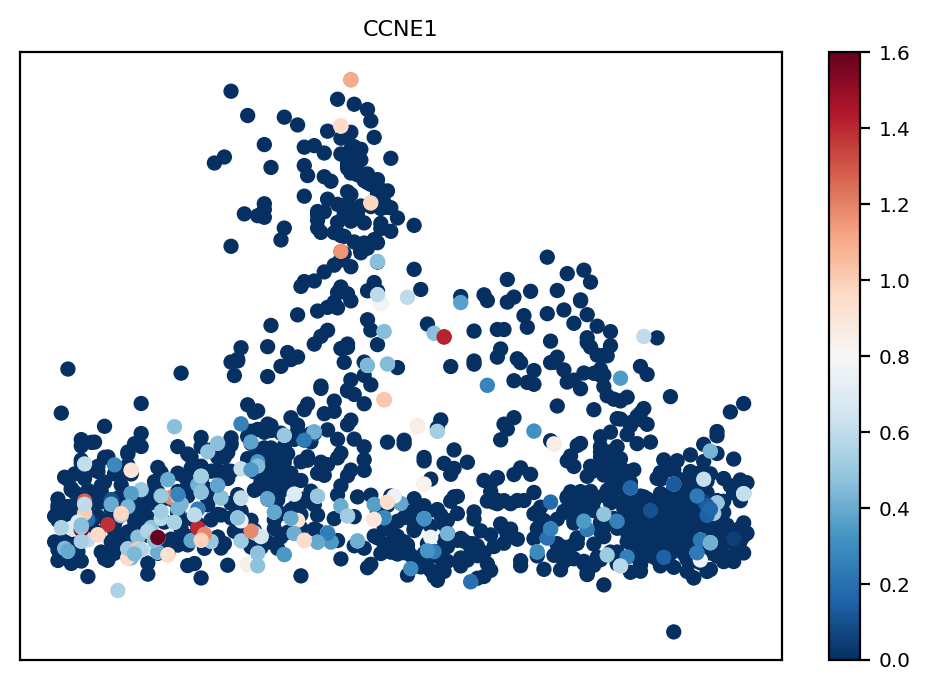

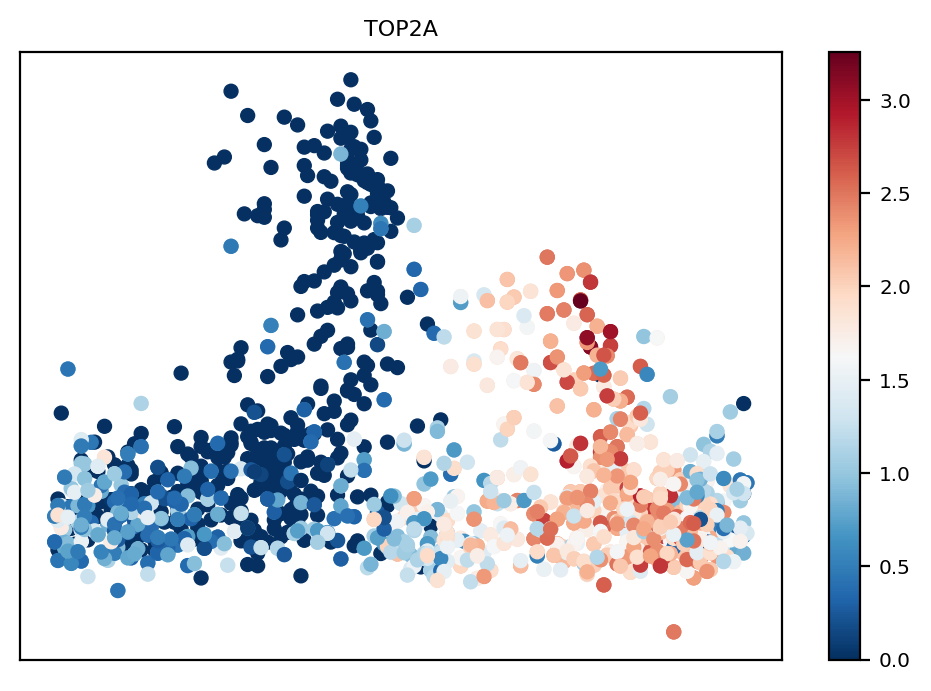

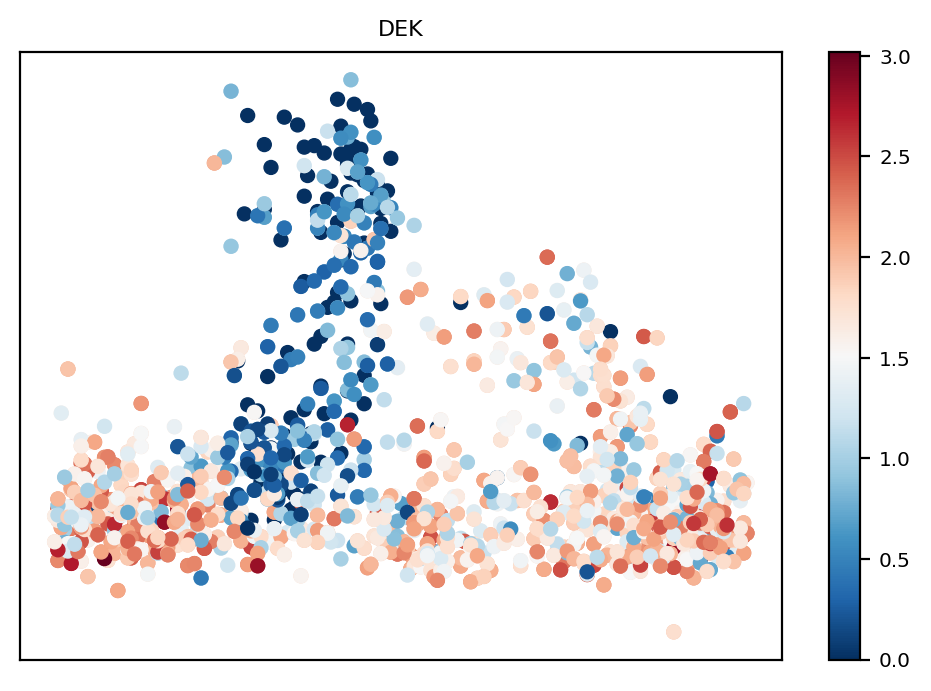

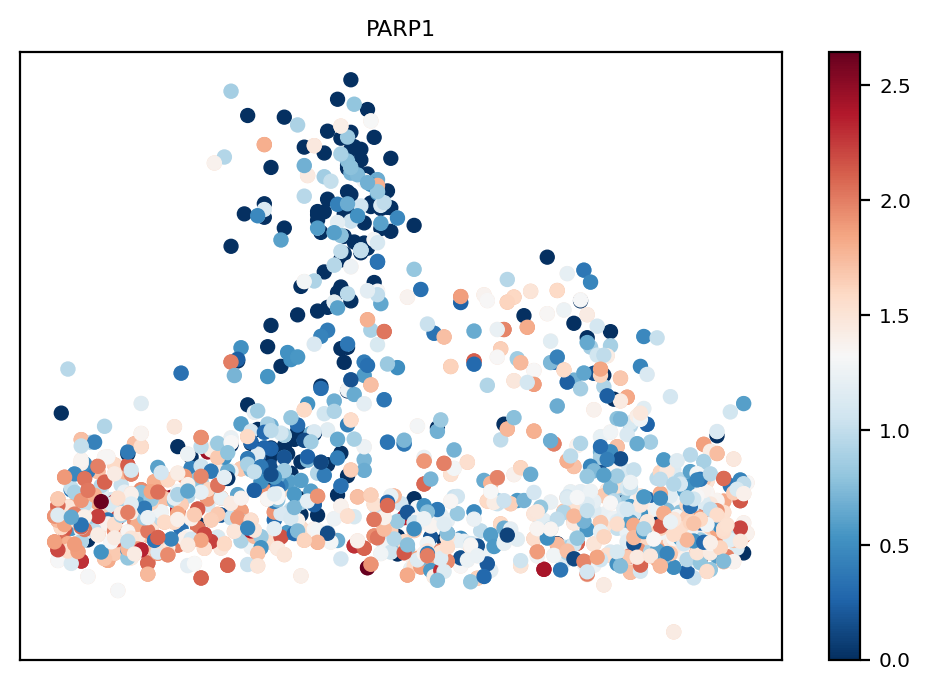

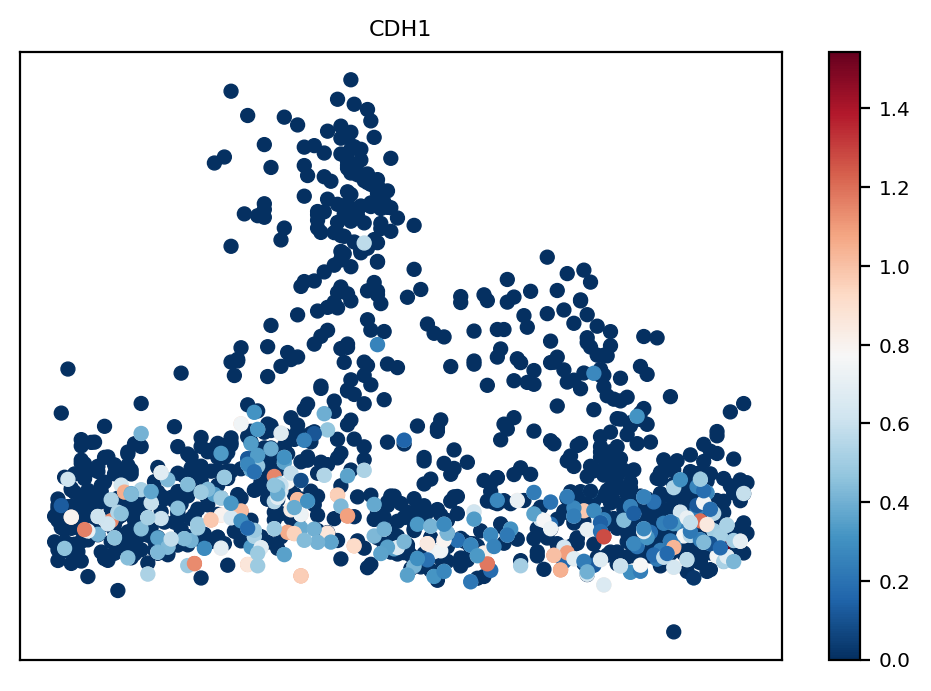

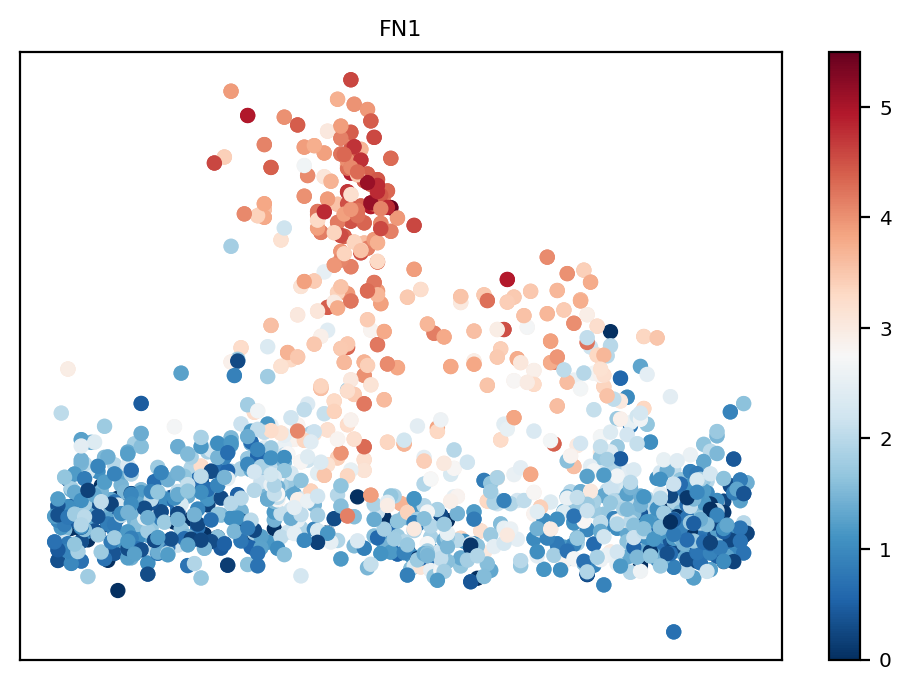

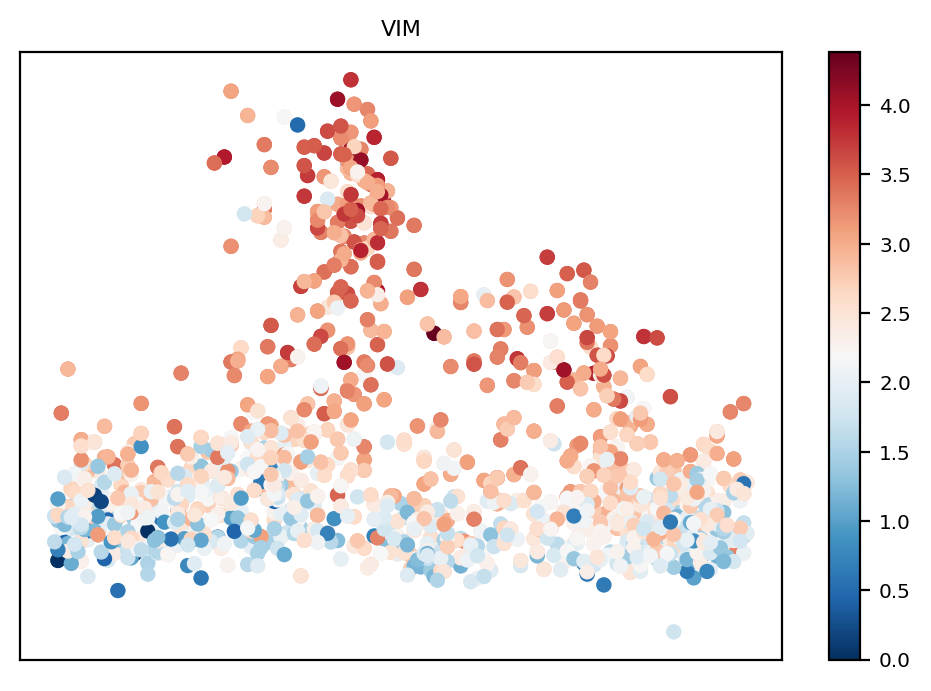

In [431]:
genes = ['CCNE1','TOP2A','DEK','PARP1','CDH1','FN1','VIM']
for gene in genes:
    gene_index = dose0.var.index.get_loc(gene)
    plt.figure(figsize=(5,3.5))
    plt.scatter(dose0.obsm['X_RC'][:,0],
                dose0.obsm['X_RC'][:,1],
                c=X_data[:,gene_index], s=25)
    temp = X_data[:,gene_index] > 0
    plt.colorbar()
    plt.scatter(dose0.obsm['X_RC'][temp,0],
                dose0.obsm['X_RC'][temp,1],
                c=X_data[temp,gene_index], s=25)
    plt.xticks([])
    plt.yticks([])
    plt.title(gene)
    plt.tight_layout()
    #plt.savefig("../plots/new_CCC/untreated/cc_emt_rep/dose0_"+gene+"_exp.png", dpi=300)
    plt.show()

# Mapping to original UMAP representation

In [65]:
#_, stable, _,_ = getFixedPoints(same_ref_without_density[0], basis='umap')
attractor1_indexes = getNNeighbors([-3.7655506, 0.94708794], 
                                    same_ref_with_density[0].obsm['X_umap'], 
                                    k=175)
attractor2_indexes = getNNeighbors([-0.35, 5.5], 
                                   same_ref_with_density[0].obsm['X_umap'], 
                                   k=175)

In [68]:
attractor1_obs = same_ref_without_density[0][attractor1_indexes[0],:].obs['obs_names']
attractor2_obs = same_ref_without_density[0][attractor2_indexes[0],:].obs['obs_names']

In [69]:
attractor1_indexes = []
for index in attractor1_obs:
    if index in dose0.obs.index.tolist():
        attractor1_indexes.append(index)
        
attractor2_indexes = []
for index in attractor2_obs:
    if index in dose0.obs.index.tolist():
        attractor2_indexes.append(index)

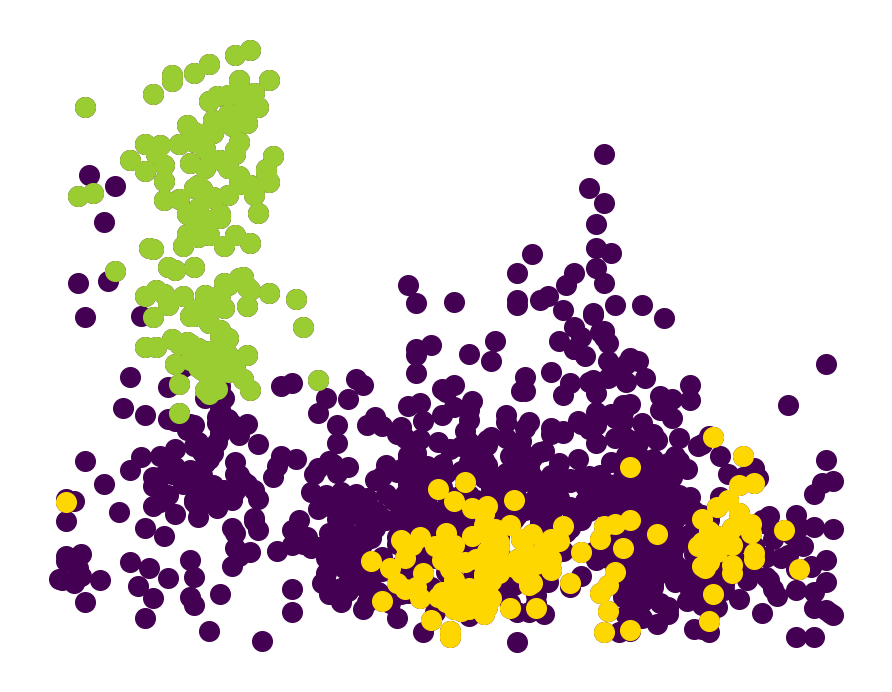

In [75]:
plt.figure(figsize=(4.5,3.5), dpi=100)
plt.subplot(1,1,1, frame_on=False)
#cmap = plt.get_cmap('Purples_r')
cmap = plt.get_cmap('viridis')
plt.scatter(dose0.obsm['X_RC'][:,0],
            dose0.obsm['X_RC'][:,1],
            #color=cmap(0.35),
            color=cmap(0),
            s=50)
#cmap = plt.get_cmap('Greens')
plt.scatter(dose0[attractor1_indexes].obsm['X_RC'][:,0],
            dose0[attractor1_indexes].obsm['X_RC'][:,1],
            #color=cmap(0.55),
            color='gold',
            s=50)
plt.scatter(dose0[attractor2_indexes].obsm['X_RC'][:,0],
            dose0[attractor2_indexes].obsm['X_RC'][:,1],
            #color=cmap(0.85),
            color='yellowgreen', 
            s=50)
plt.xticks([])
plt.yticks([])
plt.tight_layout()
#plt.savefig("../plots/new_CCC/untreated/cc_emt_rep/2_regions_CC_EMT_rep.png", transparent=True, dpi=300)

# Cell cycle along the cell cycle coordinate

In [79]:
# subset only cycling cells
dose0.obs['cell_label'] = "Quiescent"
dose0.obs['cell_label'].loc[~dose0.obs.index.isin(attractor2_indexes)] = "Cycling"

<Figure size 600x400 with 0 Axes>

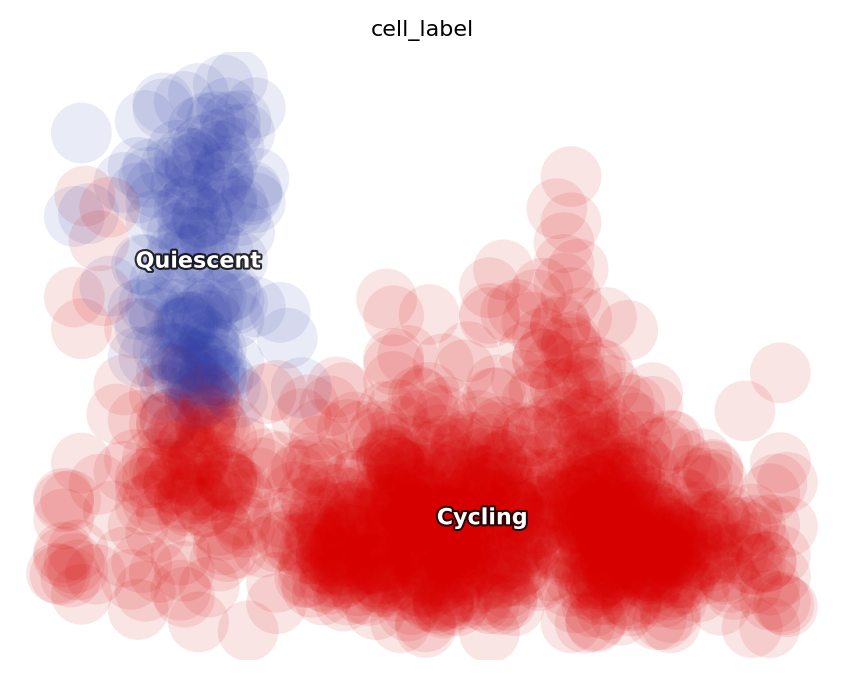

In [81]:
dyn.pl.scatters(dose0, basis='RC', color=['cell_label'])

In [82]:
dose0_cyc = dose0[dose0.obs['cell_label'] == 'Cycling']

In [89]:
dose0_cyc.var.index = dose0_cyc.var['var_names']

In [84]:
g1 = ['CCNE1','CCNE2','CLSPN','E2F1','FAM111B','MCM4',
      'PCNA','SLBP','UNG','ZMYND19', 'CDKN1A']
g2 = ['CDK1','CKAP2','H2AFX','HMGB2','HP1BP3','KIF20B','KIF23','KPNA2','LBR',
      'SMC4','TOP2A',
      'TUBB4B','UBE2C']

In [117]:
gene_order = ['CCNE1','CCNE2','E2F1','FAM111B','CDKN1A','ZMYND19','UNG','MCM4','CLSPN', 'SLBP','PCNA',
              'KIF23', 'LBR','HP1BP3','SMC4', 'H2AFX', 'HMGB2','TUBB4B','CKAP2', 'KPNA2','KIF20B', 'CDK1', 'TOP2A', 'UBE2C']

In [85]:
genes = g1 + g2

In [90]:
gene_exp = pd.DataFrame(dose0_cyc[:,genes].X.toarray(), columns=genes)
gene_exp['RC'] = dose0_cyc.obsm['X_RC'][:,0]
gene_exp = gene_exp.sort_values(by='RC')
gene_exp.index = gene_exp['RC']

In [92]:
avg_gene_exp = pd.DataFrame()
for col in gene_exp.drop('RC', axis=1).columns:
    temp = gene_exp[col]
    # get rid of the zeros
    temp = temp[temp != 0]
    temp_exp = temp.groupby(by='RC').mean()
    #temp_exp = temp_exp.fillna(0)
    avg_gene_exp = pd.concat([avg_gene_exp, temp_exp], axis=1)
avg_gene_exp = avg_gene_exp.fillna(0)

In [93]:
labels = []
for gene in genes:
    if gene in g1:
        labels.append("G1")
    else:
        labels.append("G2")
labels = pd.Series(labels, index=genes)

In [94]:
lut = dict(zip(labels.unique(), "rb"))
row_colors = labels.map(lut)

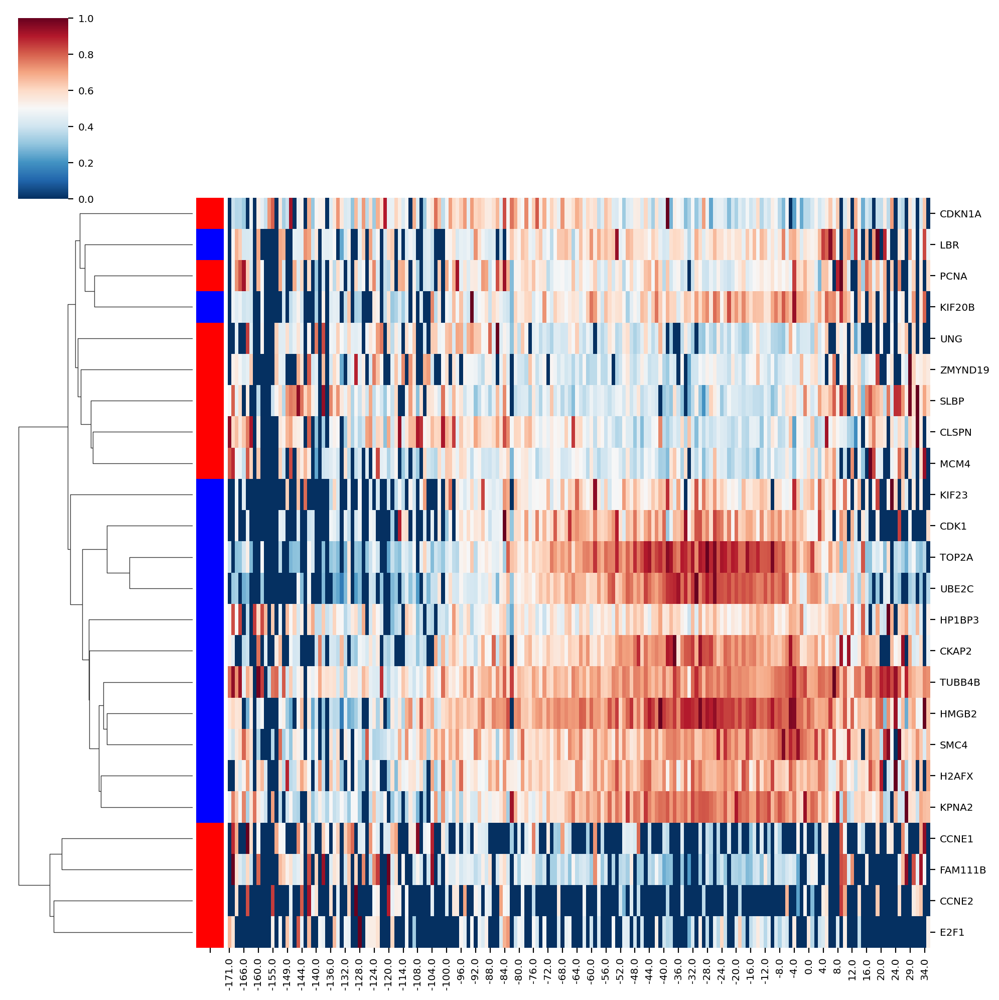

In [95]:
cm = sns.clustermap(avg_gene_exp.T,
               row_cluster=True, 
               col_cluster=False,
               row_colors=row_colors,
               cmap='RdBu_r',
               standard_scale=0,
               yticklabels=1,
               )
#cm.savefig("g1_g2_clustermap2.pdf", dpi=300, bbox_inches='tight')
#plt.close(cm.fig)

In [119]:
avg_gene_exp = avg_gene_exp[gene_order]
cm = sns.clustermap(avg_gene_exp.T,
               row_cluster=False, 
               col_cluster=False,
               row_colors=row_colors,
               cmap='RdBu_r',
               standard_scale=0,
               yticklabels=1,
               )
#cm.savefig("../plots/new_CCC/untreated/cc_emt_rep/g1_g2_clustermap2.pdf", dpi=300, bbox_inches='tight')
plt.close(cm.fig)

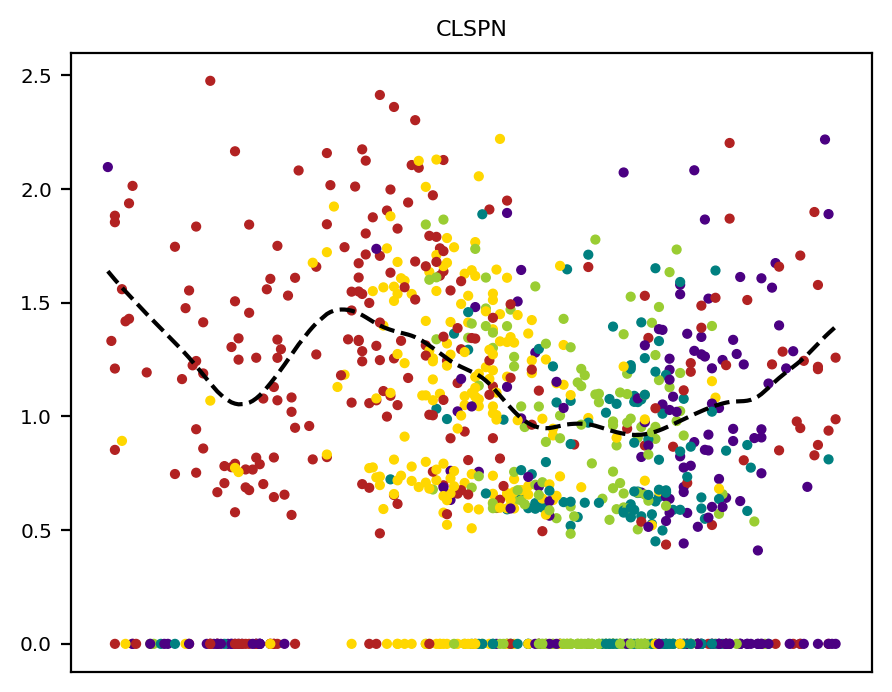

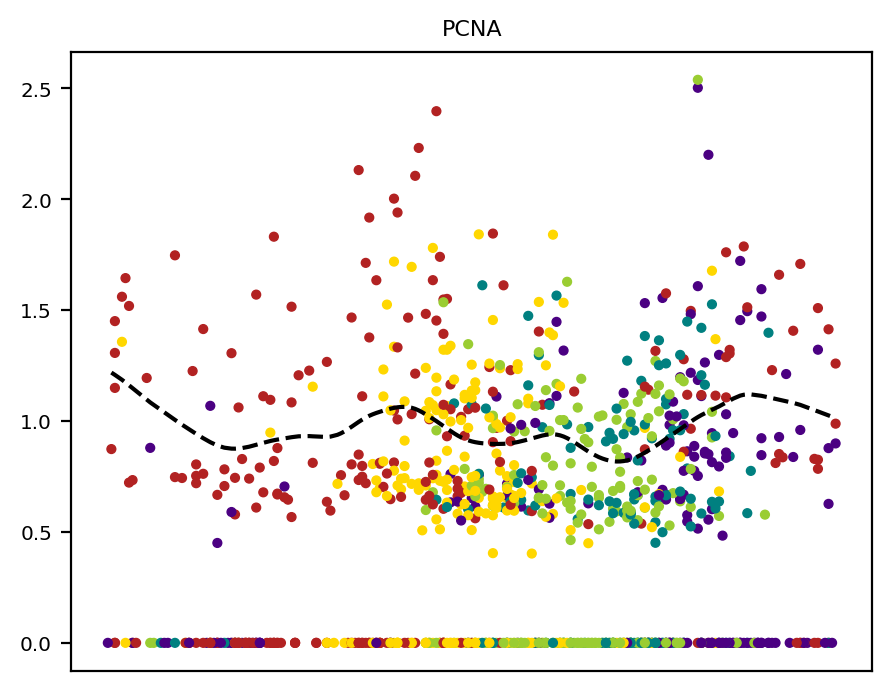

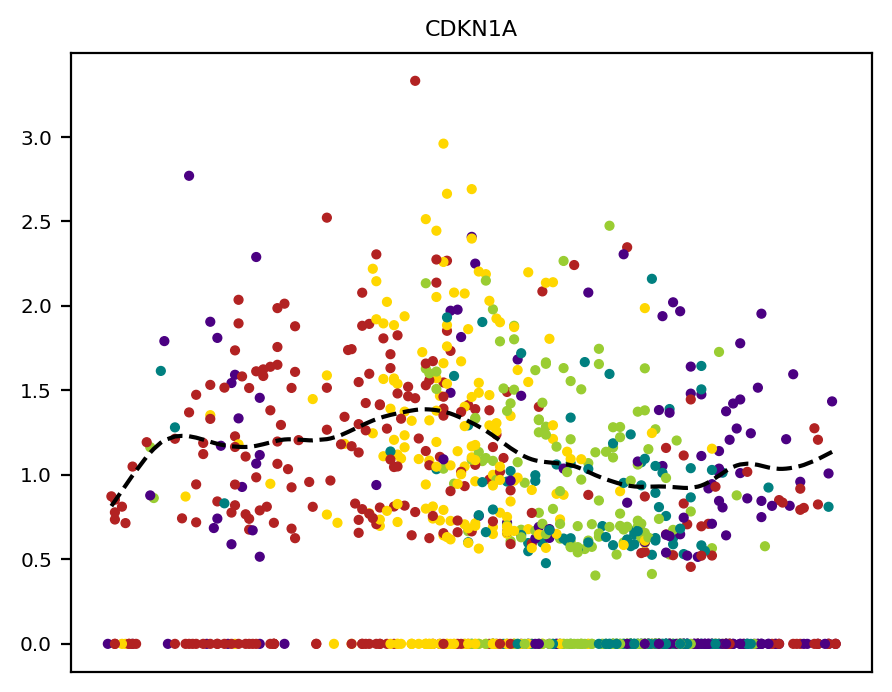

In [103]:
for gene in ['CLSPN','PCNA','CDKN1A']:
    getGeneExp2(dose0_cyc, gene, save=True, lam=10**3)

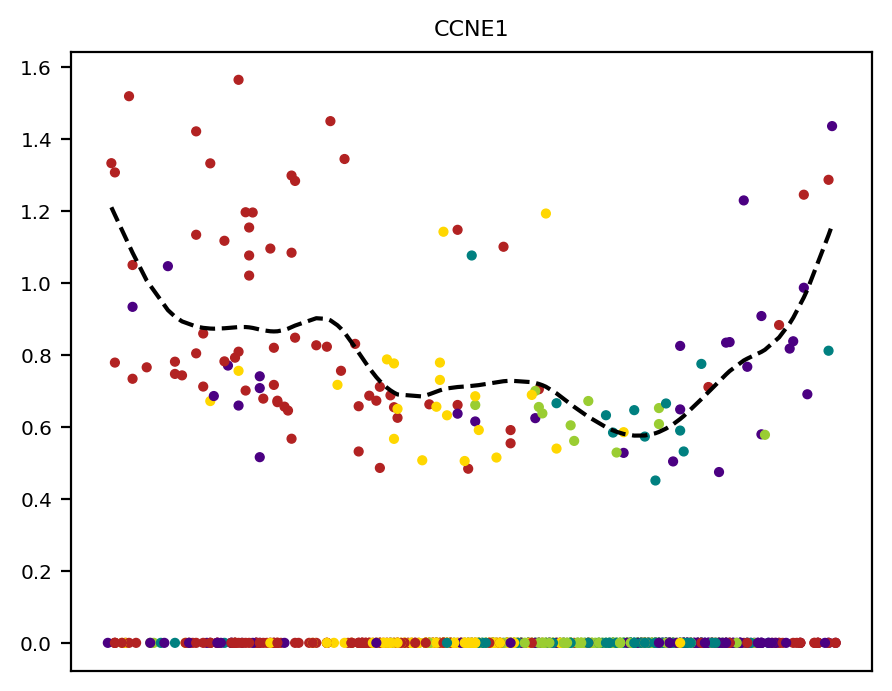

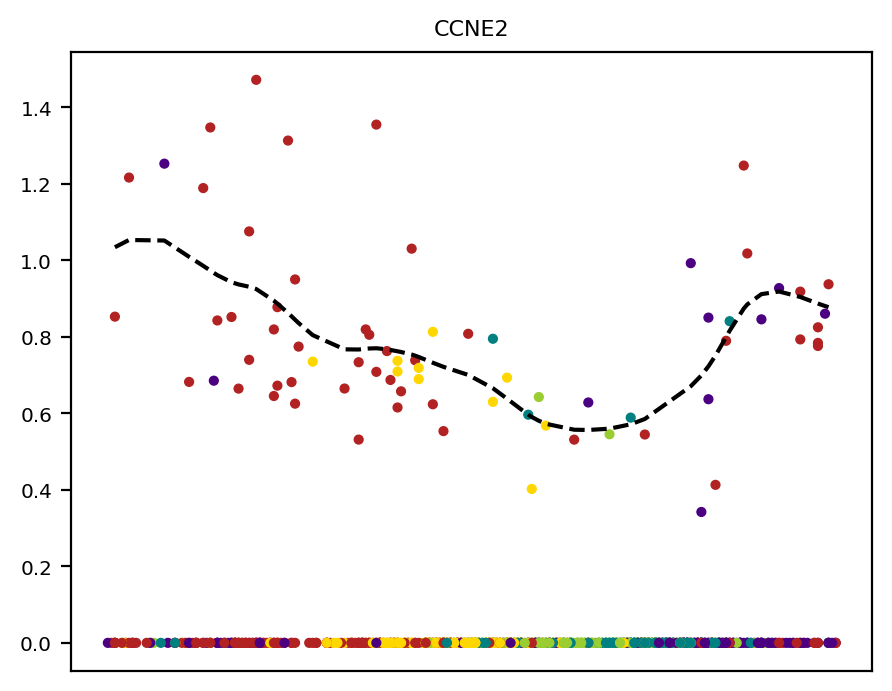

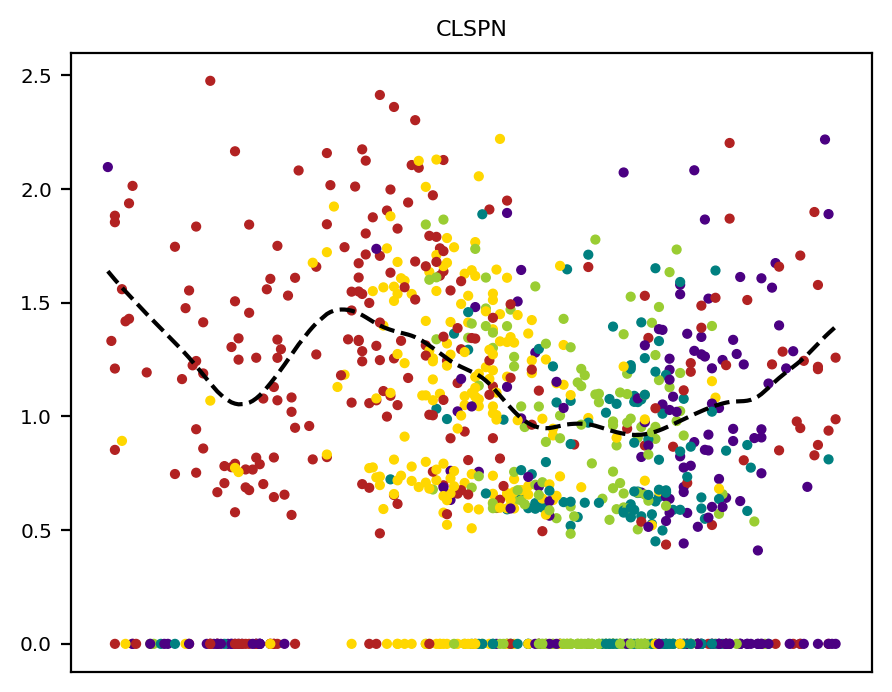

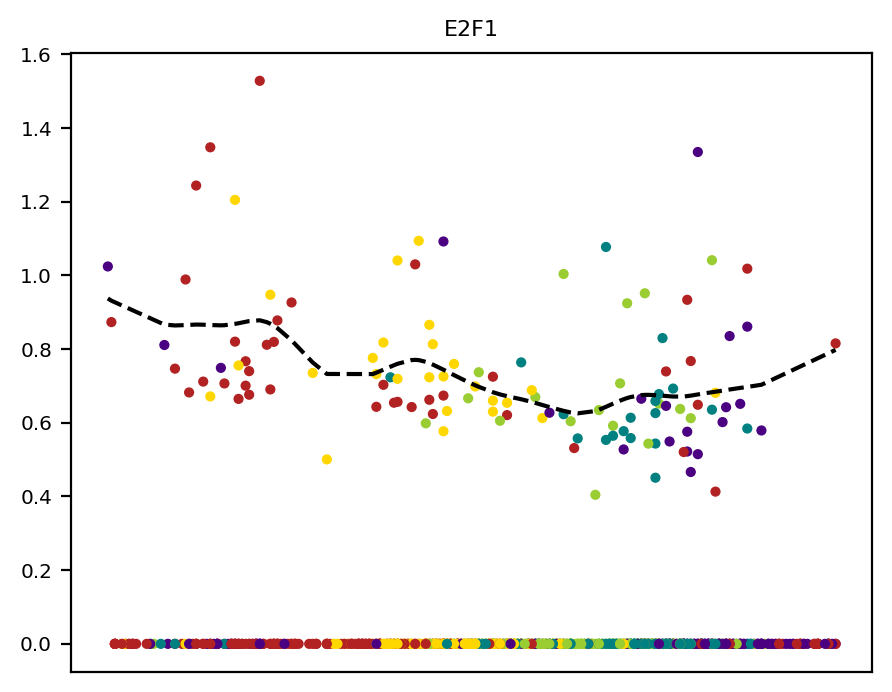

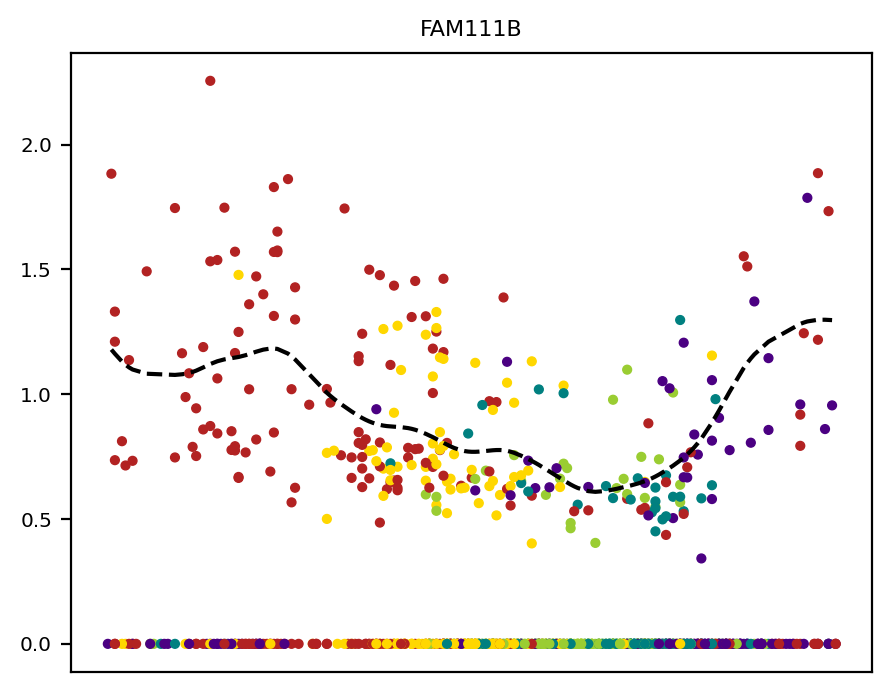

...

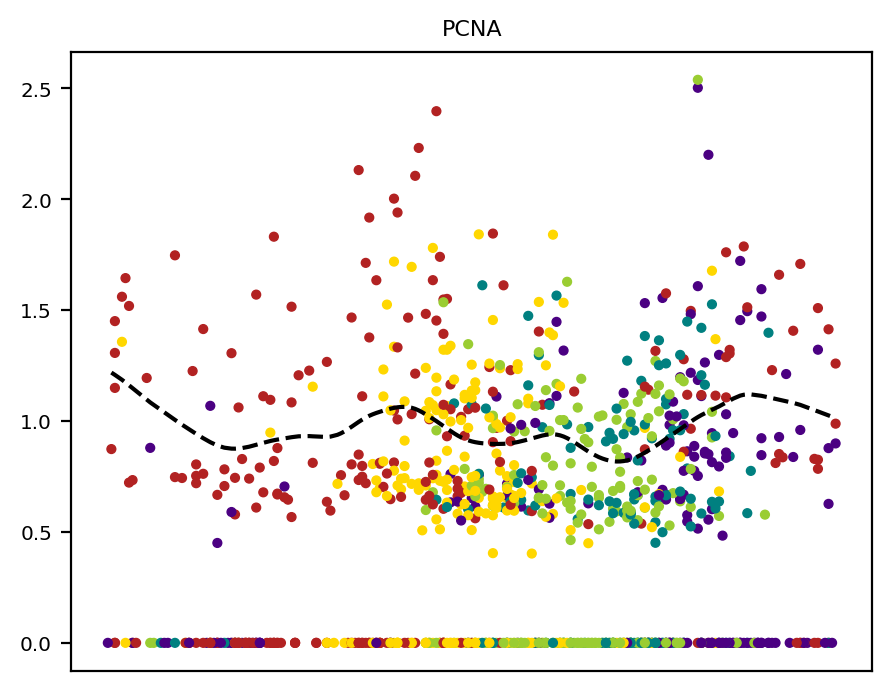

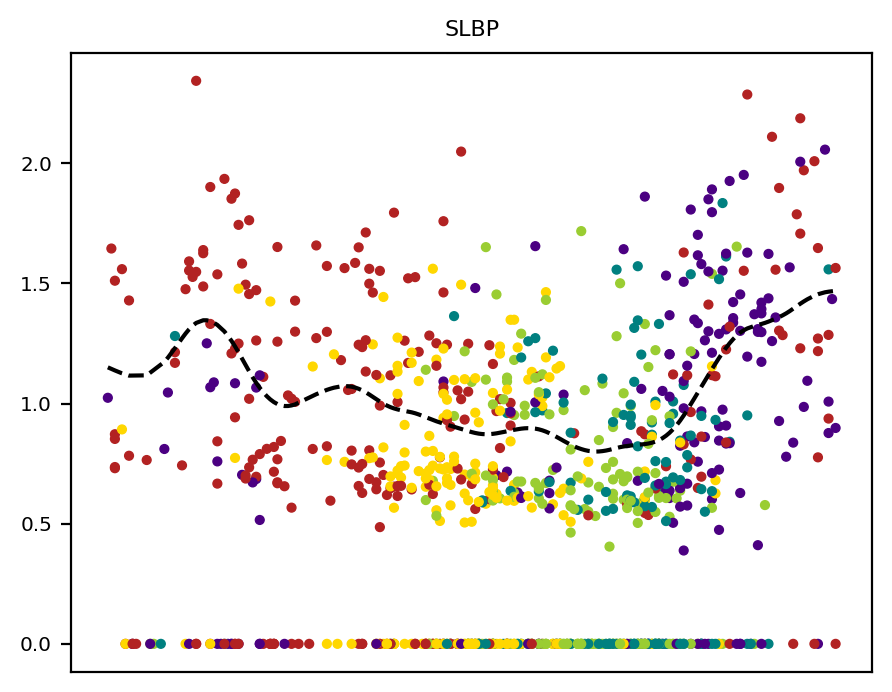

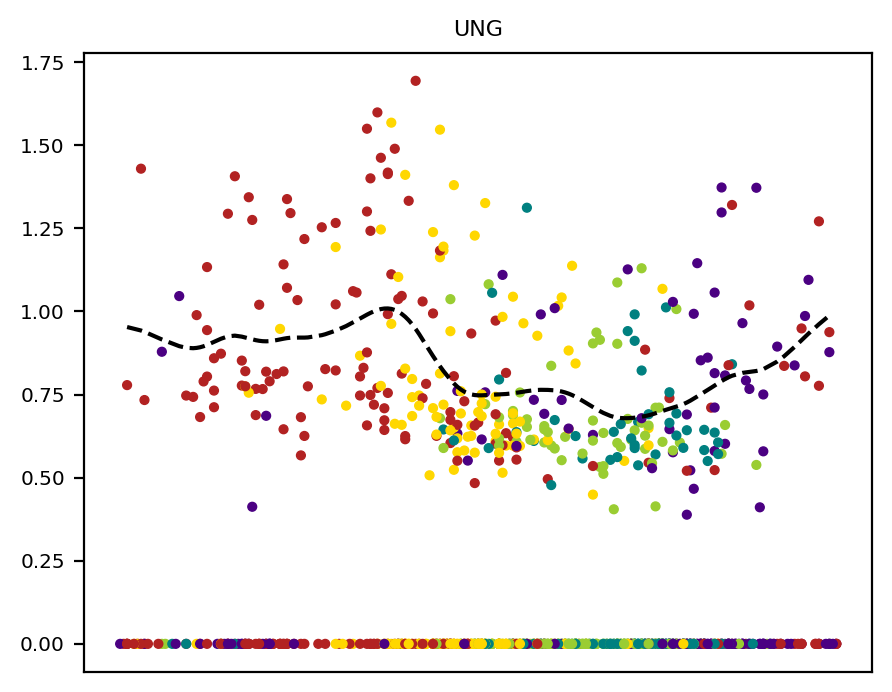

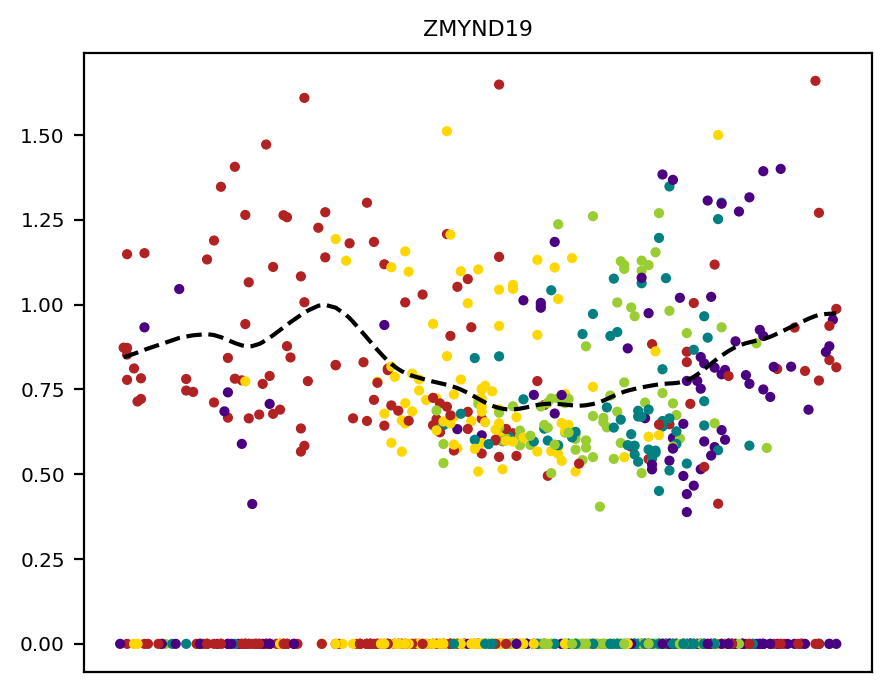

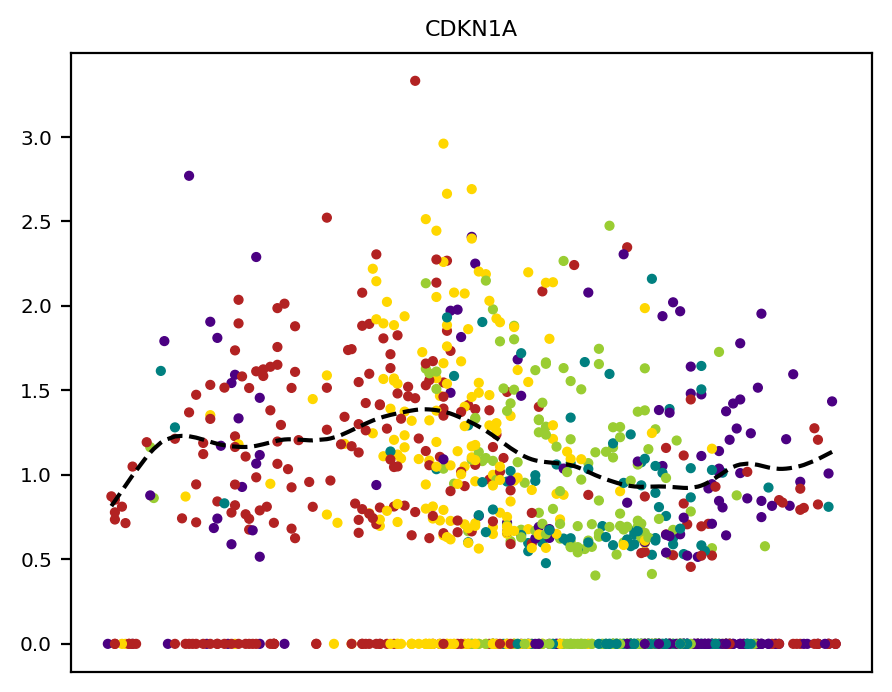

In [113]:
for gene in g1:
    getGeneExp2(dose0_cyc, gene, save=True, lam=10**3)

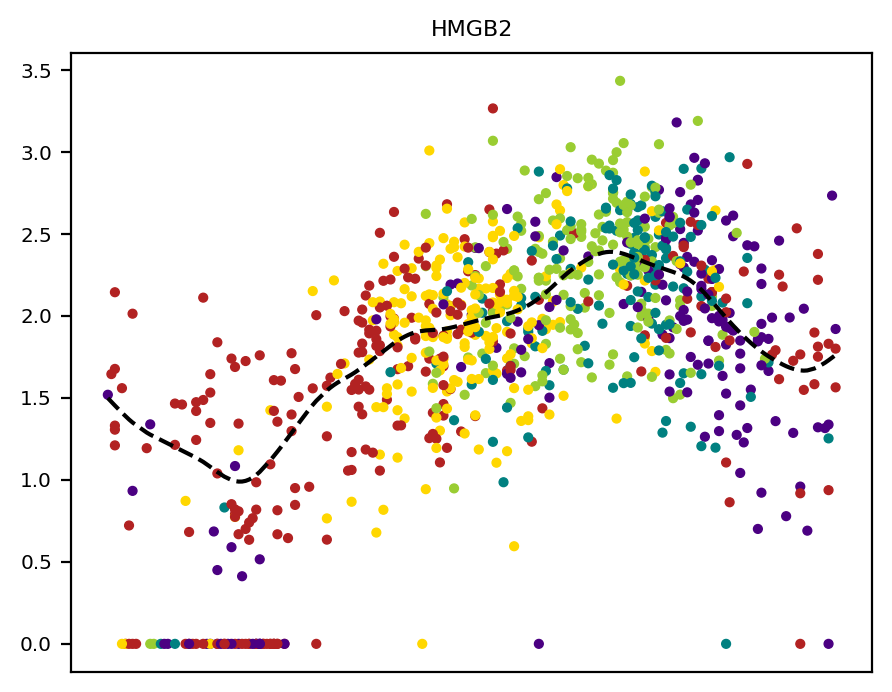

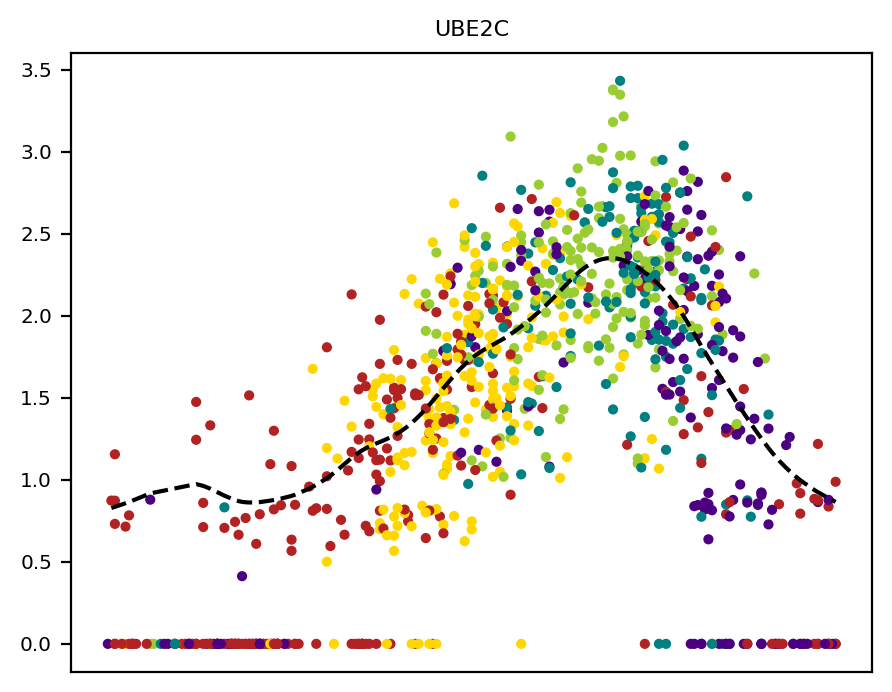

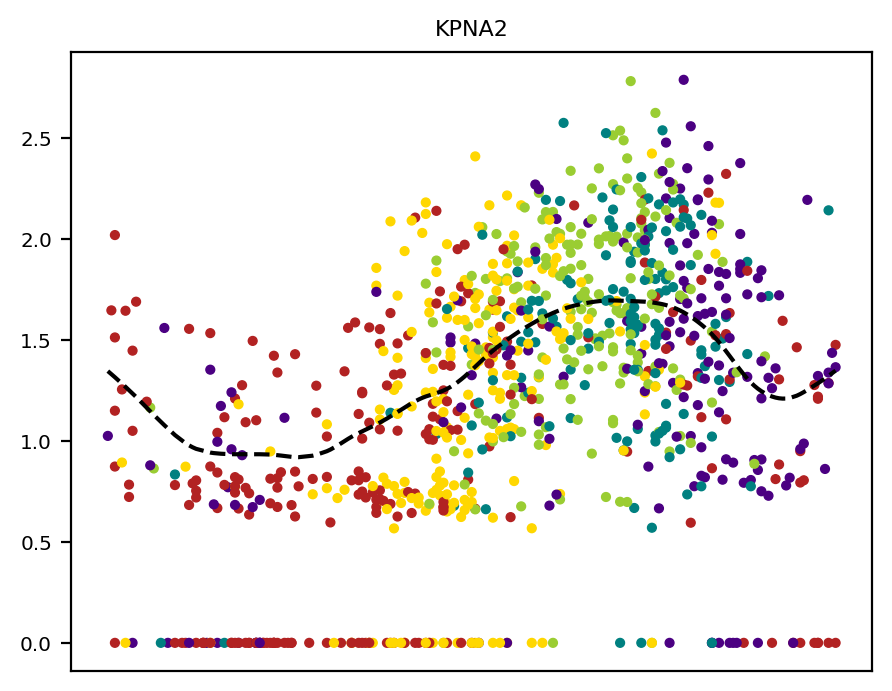

In [112]:
for gene in ['HMGB2','UBE2C','KPNA2']:
    getGeneExp2(dose0_cyc, gene, save=True, lam=10**3)